# Analyse exploratoire

Le jeu de données 'fr.openfoodfacts.org.products.csv' est nettoyé. L'analyse exploratoire va essayer de répondre aux questions de fonctionnement de l'application.


### Sommaire :

-   <a href="#A1">1) Importation du jeu de données

-   <a href="#A2">2) Analyse uni-variée</a>
   
-   <a href="#A3">3) Analyse bi-variée</a>
   
-   <a href="#A4">4) Analyse multi-variée</a>
   
-   <a href="#A5">5) ACP</a>
   

##  <a name="A1"> 1) Importation du jeu de données</a>

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler 
from sklearn.decomposition import PCA

Importation du jeu de données nettoyé

In [2]:
df = pd.read_csv('nutriscore_nettoye.csv',sep = '\t')

In [3]:
df.shape

(234445, 14)

In [4]:
df.isna().mean()

Unnamed: 0                     0.0
url                            0.0
product_name                   0.0
pnns_groups_2                  0.0
energy_100g                    0.0
sugars_100g                    0.0
fat_100g                       0.0
saturated-fat_100g             0.0
sodium_100g                    0.0
fruits-vegetables-nuts_100g    0.0
fiber_100g                     0.0
proteins_100g                  0.0
nutrition-score-fr_100g        0.0
nutrition_grade_fr             0.0
dtype: float64

In [5]:
df.dtypes

Unnamed: 0                       int64
url                             object
product_name                    object
pnns_groups_2                   object
energy_100g                    float64
sugars_100g                    float64
fat_100g                       float64
saturated-fat_100g             float64
sodium_100g                    float64
fruits-vegetables-nuts_100g    float64
fiber_100g                     float64
proteins_100g                  float64
nutrition-score-fr_100g        float64
nutrition_grade_fr              object
dtype: object

In [6]:
df

,Unnamed: 0,url,product_name,pnns_groups_2,energy_100g,sugars_100g,fat_100g,saturated-fat_100g,sodium_100g,fruits-vegetables-nuts_100g,fiber_100g,proteins_100g,nutrition-score-fr_100g,nutrition_grade_fr
0,183558,http://world-fr.openfoodfacts.org/produit/2404...,Semillas de calabaza con cáscara tostadas con sal,Appetizers,2434.0,0.000000,46.10,0.000000,0.393701,50.0,8.80,24.50,-1.0,c
1,145938,http://world-fr.openfoodfacts.org/produit/0787...,"Crispy Red Peppers, Lightly Salted",Cereals,2389.0,0.000000,42.86,0.000000,0.214000,0.0,0.00,14.29,5.0,c
2,122296,http://world-fr.openfoodfacts.org/produit/0655...,Organic French Lentils,Cereals,1490.0,0.000000,1.11,0.000000,0.011000,0.0,13.30,28.89,0.0,a
3,145936,http://world-fr.openfoodfacts.org/produit/0787...,"Tortilla Strips, Tri-Color",Appetizers,2092.0,0.000000,28.57,0.000000,0.214000,50.0,0.00,0.00,9.0,c
4,145932,http://world-fr.openfoodfacts.org/produit/0787...,"Tortilla Strips, Lightly Salted",Appetizers,2092.0,0.000000,28.57,0.000000,0.214000,50.0,0.00,0.00,9.0,c
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
234440,91089,http://world-fr.openfoodfacts.org/produit/0076...,Butter Lovers,Biscuits and cakes,1830.0,48.600000,21.90,9.380000,0.969000,50.0,9.38,6.25,20.0,e
234441,143558,http://world-fr.openfoodfacts.org/produit/0765...,"Roasted Seaweed Snacks, Brown Sugar & Sea Salt",Sweets,2092.0,0.000000,30.00,2.753024,1.200000,5.5,20.00,20.00,2.0,b
234442,88886,http://world-fr.openfoodfacts.org/produit/0075...,"Simplylight, Sugar Free, Low Calorie Drink Mix...",Sweets,1046.0,17.400306,0.00,1.988457,1.750000,5.5,0.00,0.00,14.0,d
234443,124904,http://world-fr.openfoodfacts.org/produit/0688...,"Sugar Free Drink Mix, Lemonade",Sweets,1046.0,17.400306,0.00,1.988457,1.750000,5.5,0.00,0.00,14.0,d


Je supprime la colonne Unnamed

In [7]:
df.drop(['Unnamed: 0'],axis = 1 , inplace = True)

##  <a name="A2"> 2) Analyse uni-variée</a>

L'analyse uni-variée permet de mieux comprendre une variable isolée (quelles sont ses valeurs extrêmes, la distribution des valeurs ...) 

### Analyse descriptive des variables numériques

In [8]:
var_num = ['energy_100g','sugars_100g','fat_100g','saturated-fat_100g','sodium_100g','fruits-vegetables-nuts_100g','fiber_100g','proteins_100g','nutrition-score-fr_100g']
df[var_num].describe()

,energy_100g,sugars_100g,fat_100g,saturated-fat_100g,sodium_100g,fruits-vegetables-nuts_100g,fiber_100g,proteins_100g,nutrition-score-fr_100g
count,234445.000000,234445.000000,234445.000000,234445.000000,234445.000000,234445.000000,234445.000000,234445.000000,234445.000000
mean,1125.274665,15.792036,12.397320,4.623058,0.341173,11.635457,2.377375,6.931427,11.132957
std,768.986997,20.667946,15.985467,7.361382,0.964167,18.987717,4.020318,7.236082,6.707072
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-14.000000
25%,389.000000,1.400000,0.200000,0.000000,0.025000,0.000000,0.000000,0.900000,6.000000
50%,1113.000000,5.650000,5.500000,1.350000,0.209000,5.500000,1.000000,5.000000,10.000000
75%,1674.000000,24.000000,20.000000,6.670000,0.494000,15.600000,3.300000,10.000000,15.000000
max,3766.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,53.000000,30.000000


Les valeurs sont bien comprises entre 0 et 100 (3766 pour energy), et entre -15 et 40 pour le nutriscore.

La médiane et la moyenne du nutriscore sont à 10 et 11, ce qui correspond au passage de la lettre C à la lettre D. On devrait donc avoir plus de "mauvaises" notes que de "bonnes".

### Distribution des variables quantitatives

<AxesSubplot:>

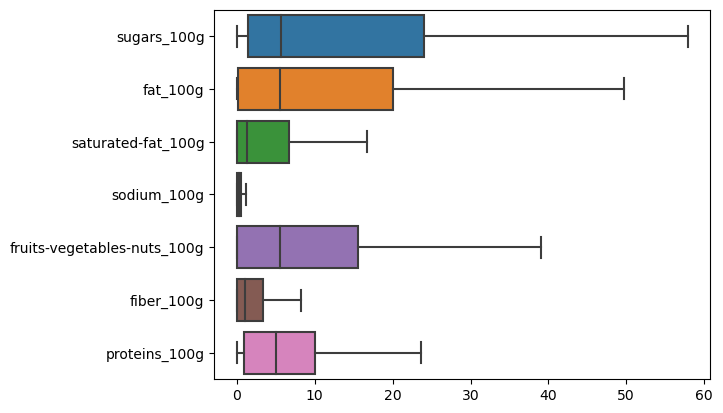

In [9]:
sns.boxplot(data = df[['sugars_100g','fat_100g','saturated-fat_100g','sodium_100g','fruits-vegetables-nuts_100g','fiber_100g','proteins_100g']], orient = 'h', showfliers = False)

<AxesSubplot:>

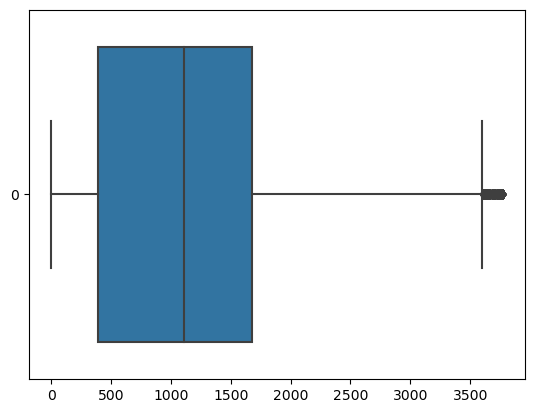

In [10]:
sns.boxplot(data = df['energy_100g'], orient = 'h')

<AxesSubplot:>

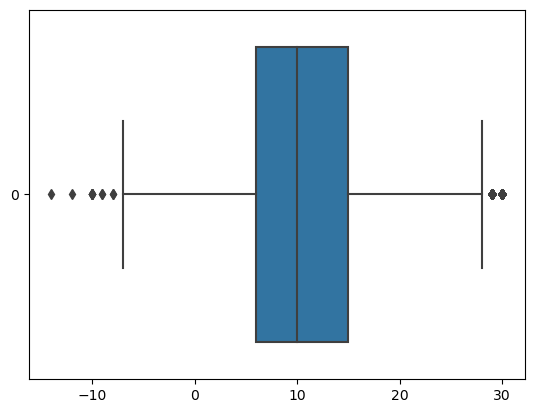

In [11]:
sns.boxplot(data = df['nutrition-score-fr_100g'], orient = 'h')

Text(0.5, 0, 'Quantité en kilojoules')

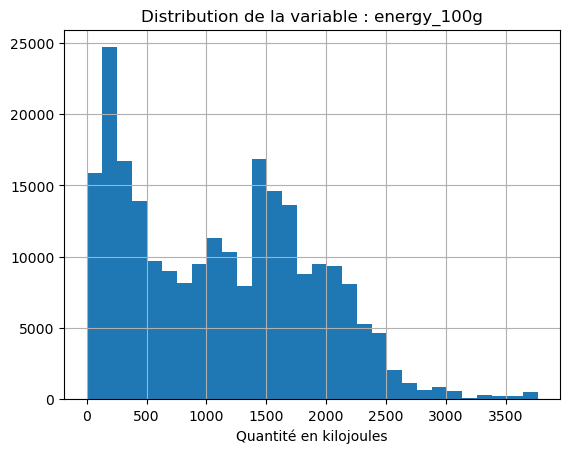

In [12]:
df['energy_100g'].hist(bins = 30)
plt.title('Distribution de la variable : energy_100g')
plt.xlabel('Quantité en kilojoules')

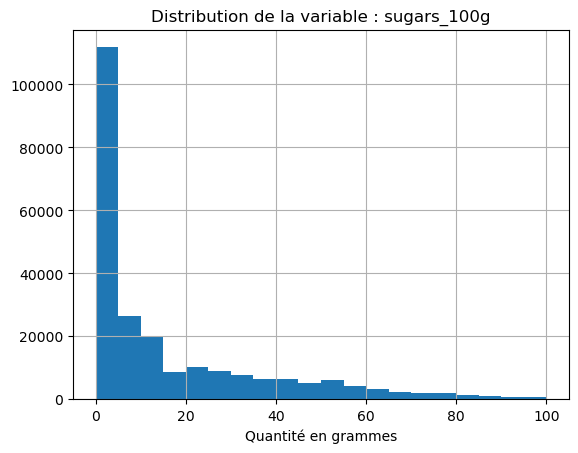

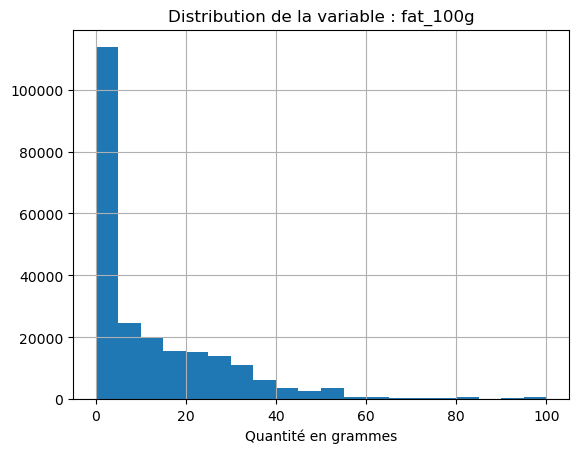

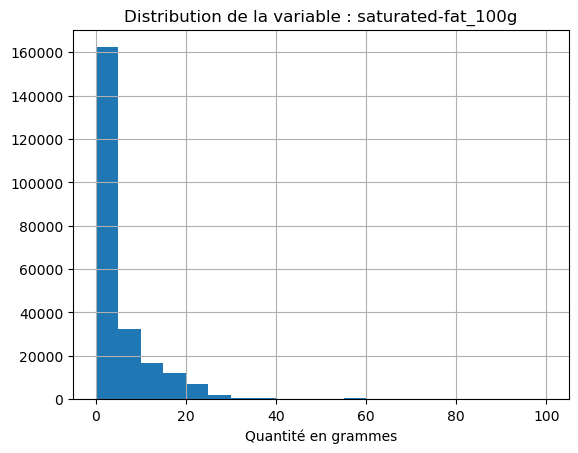

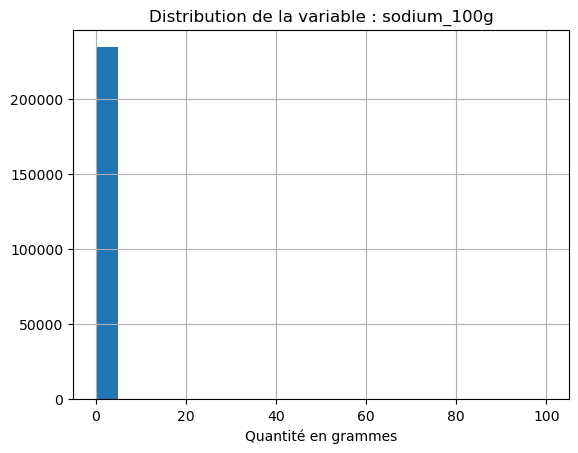

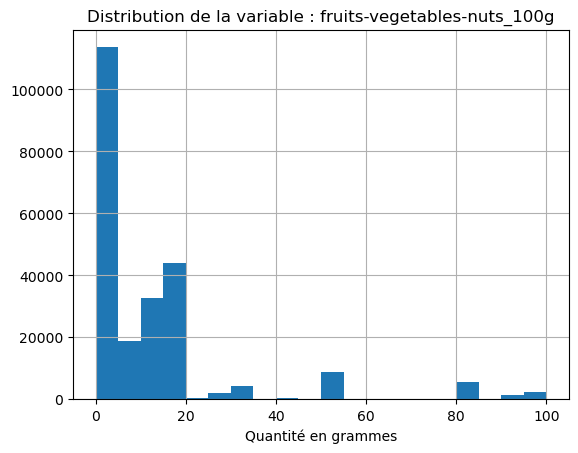

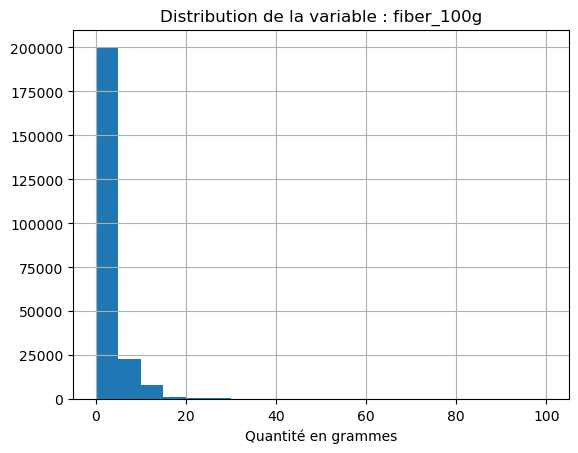

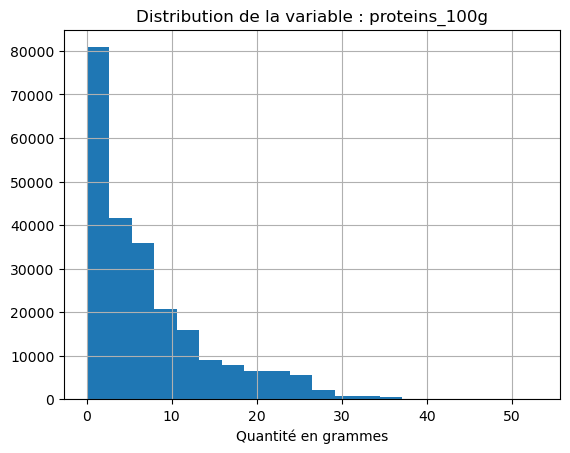

In [13]:
for c in ['sugars_100g','fat_100g','saturated-fat_100g','sodium_100g','fruits-vegetables-nuts_100g','fiber_100g','proteins_100g'] :
    df[c].hist( bins = 20)
    plt.title('Distribution de la variable : ' + c)
    plt.xlabel('Quantité en grammes')
    plt.show()

Text(0.5, 0, 'Note')

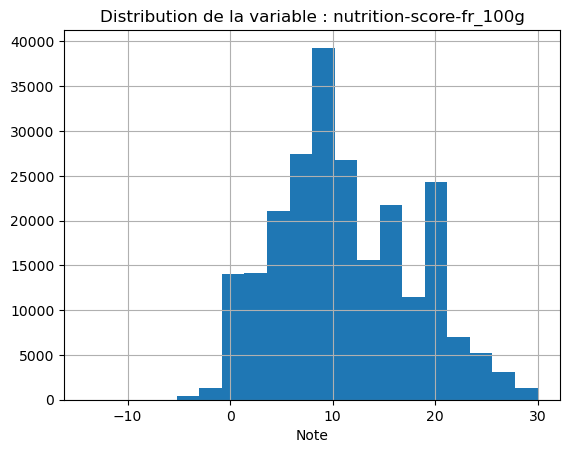

In [14]:
df['nutrition-score-fr_100g'].hist( bins = 20)
plt.title('Distribution de la variable : nutrition-score-fr_100g')
plt.xlabel('Note')

 A part le sel et les fibres, les produits ont une grande variabilité des nutriments

### Distribution des variables qualitatives

2 représentations du nutrigrade

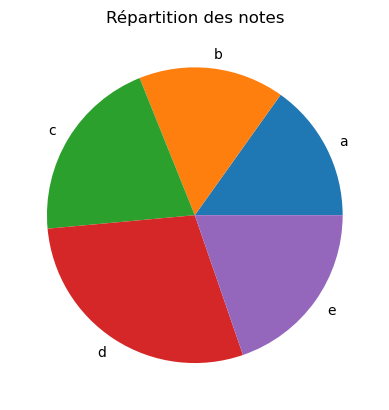

In [15]:
plt.pie(x = df.groupby('nutrition_grade_fr')['nutrition_grade_fr'].count(), labels = ['a','b','c','d','e'])
plt.title('Répartition des notes')
plt.show()

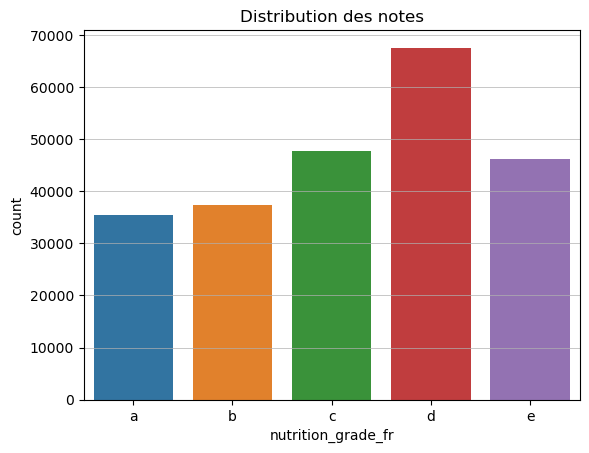

In [16]:
sns.countplot(x = df['nutrition_grade_fr'], order = ['a','b','c','d','e'])
plt.title('Distribution des notes')
plt.grid(axis = 'y', linewidth = 0.5)
plt.show()

Comme prévu, on a une majorité de "mauvaises" notes, principalement le D.

Distribution des groupes

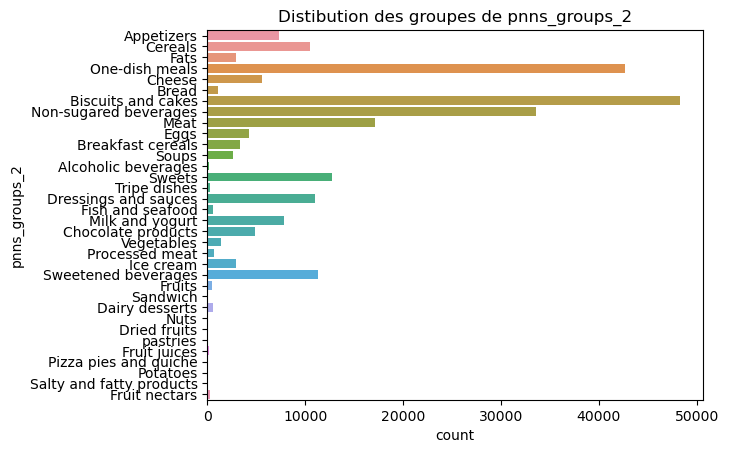

In [17]:
sns.countplot(y = df['pnns_groups_2'], orient = 'h')
plt.title('Distibution des groupes de pnns_groups_2')
plt.show()

Trois groupes sortent du lot pour leur effectif : one-dish meals, Biscuits and cakes et Non-sugared beverages.

##  <a name="A3">3) Analyse bi-variée</a>

L'anlyse bi-variée permet de voir les interactions entre 2 variables.

Voyons dans un premier temps les relations entre pnns_groups_2 et le nutrigrade.

Quels sont les groupes les mieux notés ? Les moins bien notés ?

Peut-on toujours trouver un produit du même groupe et mieux noté ?

In [18]:
# tableau de contingence entre groupes et scores en lettre

X = 'pnns_groups_2'
Y = 'nutrition_grade_fr'

tab_cont = df[[X,Y]].pivot_table(index=X,columns=Y,aggfunc=len,margins=True,margins_name="Total")
tab_cont.fillna(0,inplace = True)
tab_cont

nutrition_grade_fr,a,b,c,d,e,Total
pnns_groups_2,,,,,,
Alcoholic beverages,0.0,16.0,158.0,7.0,5.0,186
Appetizers,1653.0,559.0,2385.0,2190.0,543.0,7330
Biscuits and cakes,763.0,937.0,8306.0,19551.0,18685.0,48242
Bread,908.0,51.0,82.0,44.0,5.0,1090
Breakfast cereals,1416.0,304.0,1204.0,435.0,28.0,3387
Cereals,5954.0,1095.0,1854.0,1120.0,430.0,10453
Cheese,38.0,29.0,144.0,2131.0,3208.0,5550
Chocolate products,40.0,19.0,207.0,1396.0,3247.0,4909
Dairy desserts,14.0,28.0,228.0,243.0,21.0,534


Selon les groupes, on ne pourra pas toujours remplacer un produit par un produit "similaire" et mieux noté.

Plusieurs groupes n'ont pas de produit noté A ou B.

Je rajoute une colonne fréquence en pourcentage pour chaque note

In [19]:
groupes = df['pnns_groups_2'].unique()

for l in ['a','b','c','d','e'] :
    tab_cont[l + '_pourcentage'] = tab_cont.loc[:,l]/tab_cont.loc[:,'Total']*100

tab_cont

nutrition_grade_fr,a,b,c,d,e,Total,a_pourcentage,b_pourcentage,c_pourcentage,d_pourcentage,e_pourcentage
pnns_groups_2,,,,,,,,,,,
Alcoholic beverages,0.0,16.0,158.0,7.0,5.0,186,0.000000,8.602151,84.946237,3.763441,2.688172
Appetizers,1653.0,559.0,2385.0,2190.0,543.0,7330,22.551160,7.626194,32.537517,29.877217,7.407913
Biscuits and cakes,763.0,937.0,8306.0,19551.0,18685.0,48242,1.581609,1.942291,17.217362,40.526927,38.731810
Bread,908.0,51.0,82.0,44.0,5.0,1090,83.302752,4.678899,7.522936,4.036697,0.458716
Breakfast cereals,1416.0,304.0,1204.0,435.0,28.0,3387,41.806909,8.975495,35.547682,12.843224,0.826690
Cereals,5954.0,1095.0,1854.0,1120.0,430.0,10453,56.959724,10.475462,17.736535,10.714627,4.113652
Cheese,38.0,29.0,144.0,2131.0,3208.0,5550,0.684685,0.522523,2.594595,38.396396,57.801802
Chocolate products,40.0,19.0,207.0,1396.0,3247.0,4909,0.814830,0.387044,4.216745,28.437564,66.143817
Dairy desserts,14.0,28.0,228.0,243.0,21.0,534,2.621723,5.243446,42.696629,45.505618,3.932584


In [20]:
tab_cont.sort_values('a_pourcentage', ascending = False)

nutrition_grade_fr,a,b,c,d,e,Total,a_pourcentage,b_pourcentage,c_pourcentage,d_pourcentage,e_pourcentage
pnns_groups_2,,,,,,,,,,,
Bread,908.0,51.0,82.0,44.0,5.0,1090,83.302752,4.678899,7.522936,4.036697,0.458716
Cereals,5954.0,1095.0,1854.0,1120.0,430.0,10453,56.959724,10.475462,17.736535,10.714627,4.113652
Sandwich,3.0,0.0,3.0,0.0,0.0,6,50.000000,0.000000,50.000000,0.000000,0.000000
Breakfast cereals,1416.0,304.0,1204.0,435.0,28.0,3387,41.806909,8.975495,35.547682,12.843224,0.826690
Fish and seafood,192.0,33.0,84.0,112.0,117.0,538,35.687732,6.133829,15.613383,20.817844,21.747212
Dressings and sauces,3222.0,1310.0,2999.0,2433.0,1026.0,10990,29.317561,11.919927,27.288444,22.138308,9.335760
Eggs,954.0,1013.0,693.0,1193.0,367.0,4220,22.606635,24.004739,16.421801,28.270142,8.696682
Appetizers,1653.0,559.0,2385.0,2190.0,543.0,7330,22.551160,7.626194,32.537517,29.877217,7.407913
Milk and yogurt,1655.0,1875.0,2776.0,1317.0,174.0,7797,21.226113,24.047711,35.603437,16.891112,2.231628


Affichons maintenant les 10 groupes qui receuillent le plus de notes a, b, c, d et e.

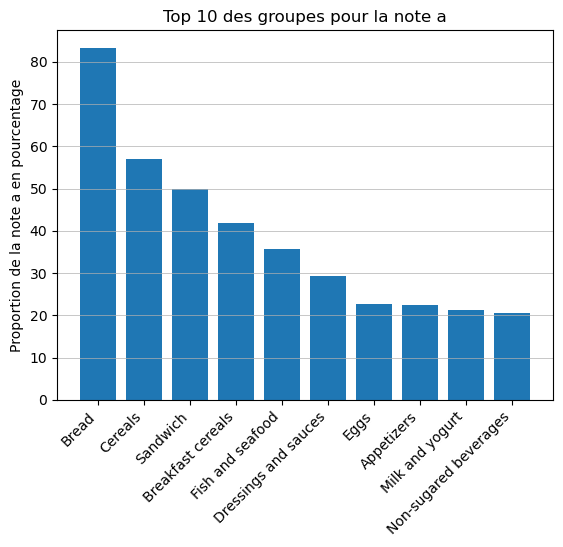

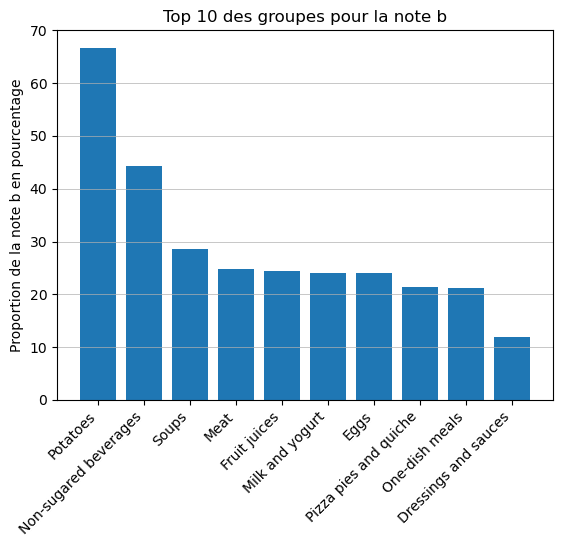

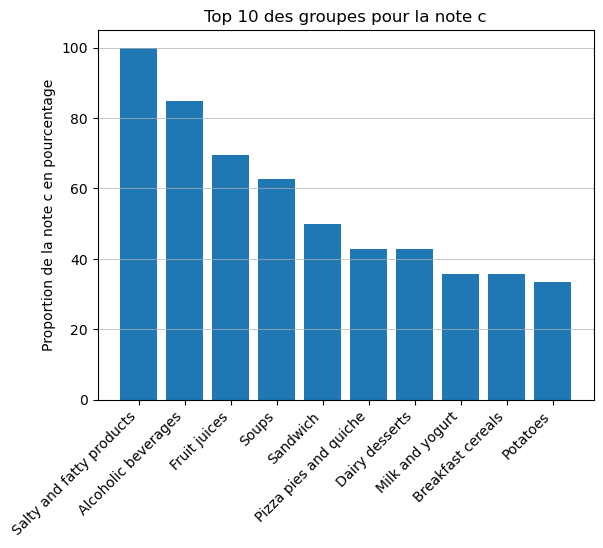

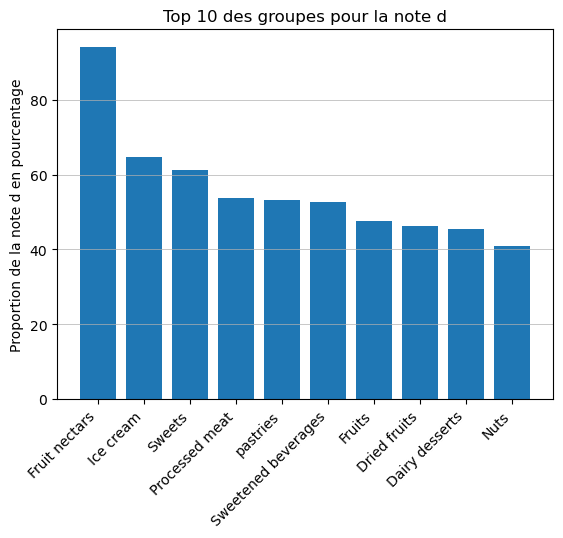

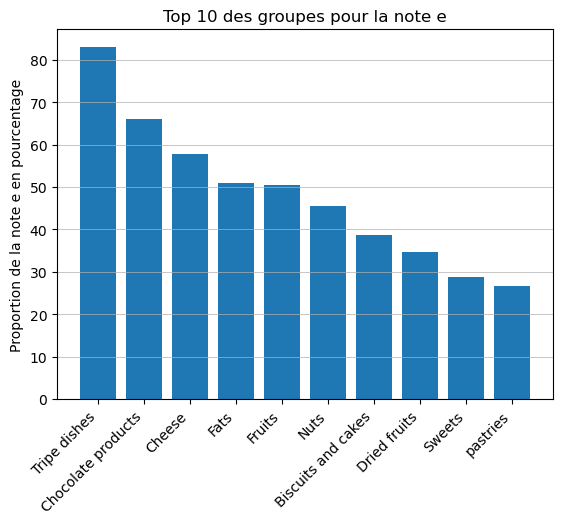

In [21]:
# Top 10 des catégories par lettre

for note in ['a','b','c','d','e'] :
    donnees = tab_cont.drop('Total').sort_values((note + '_pourcentage'), ascending = False).head(10)
    plt.bar(x = donnees.index, height = donnees[(note + '_pourcentage')])
    plt.xticks(rotation = 45, ha='right')
    plt.ylabel('Proportion de la note ' + note + ' en pourcentage')
    plt.title('Top 10 des groupes pour la note ' + note)
    plt.grid(axis = 'y', linewidth = 0.5)
    plt.show()

Le groupe "bread" est celui qui récolte le plus de A en proportion suivi de "cereals" et de "breakfast cereals".

Le groupe "Tripe dishes" est celui qui récolte le plus de E en proportions suivi de "chocolate products" et de "cheese".

Voyons maintenant la répartition des notes selon les variables quantitatives.

Comment varient les nutriments en fonction de la note du produit ?


Fonction qui calcule le eta squared (recopié du cours)

In [22]:
# X est qualitative
# Y est quantitative

def eta_squared(x,y):
    moyenne_y = y.mean()
    classes = []
    for classe in x.unique():
        yi_classe = y[x==classe]
        classes.append({'ni': len(yi_classe),
                        'moyenne_classe': yi_classe.mean()})
    SCT = sum([(yj-moyenne_y)**2 for yj in y])
    SCE = sum([c['ni']*(c['moyenne_classe']-moyenne_y)**2 for c in classes])
    return SCE/SCT


Affichons cette répartition avec le eta squared

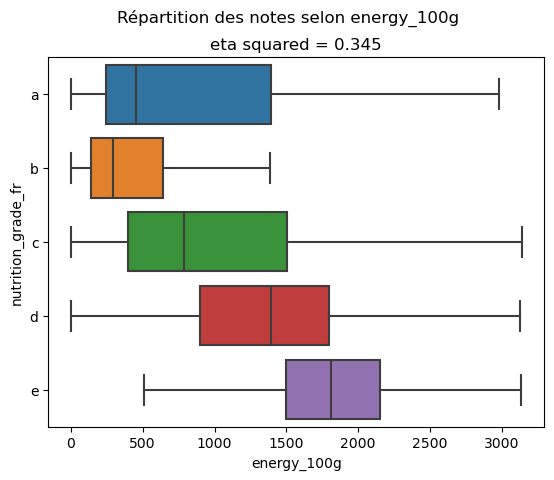

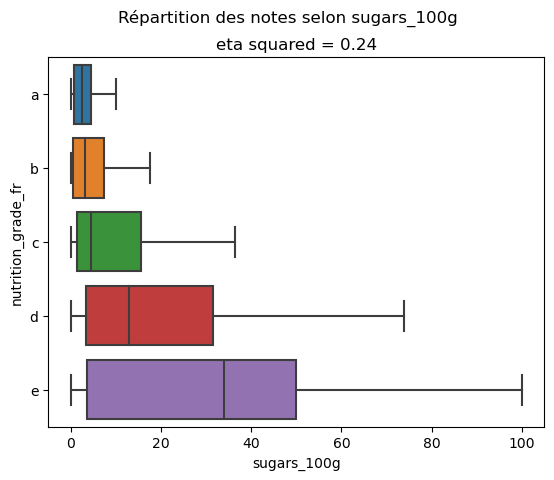

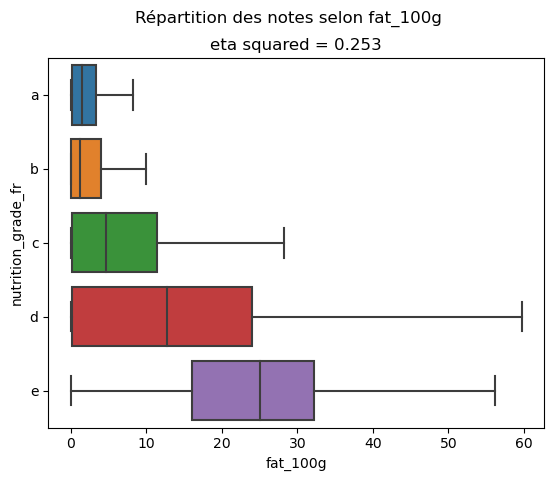

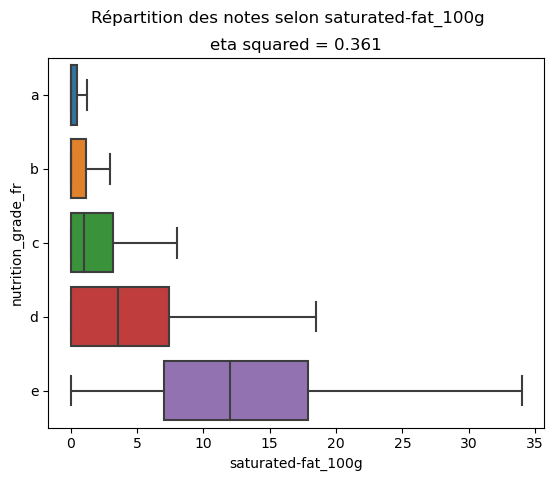

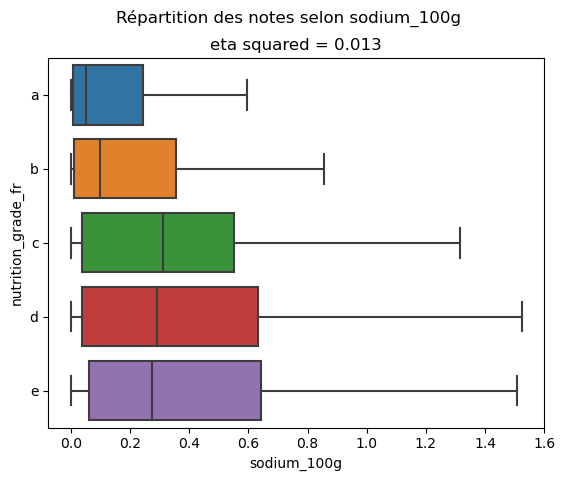

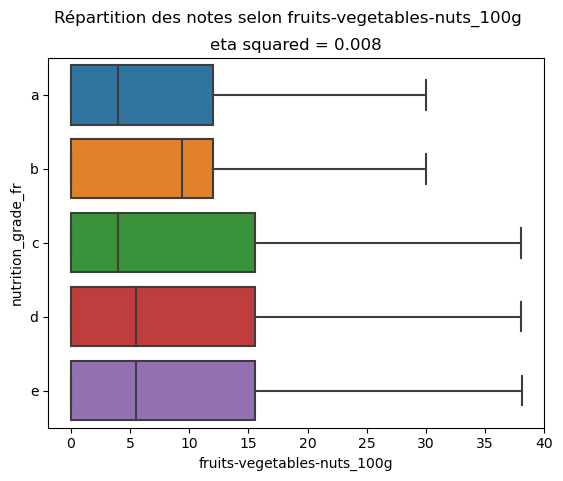

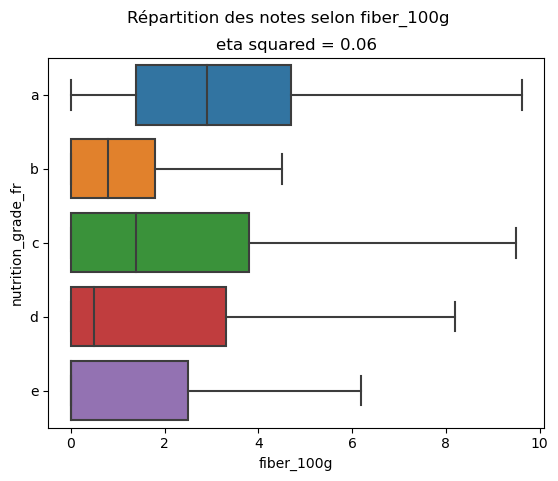

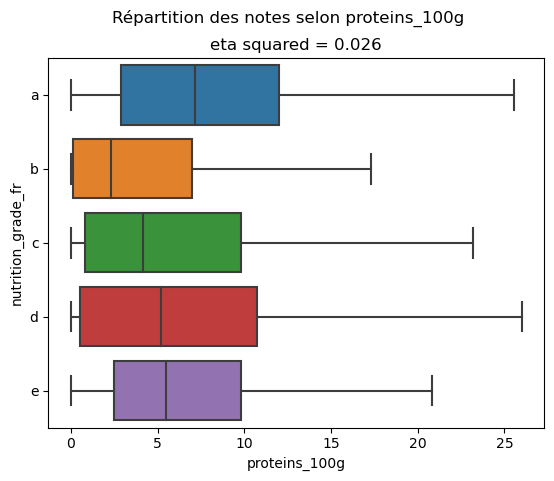

In [23]:
# répartition des notes pour chaque variable

variables = ['energy_100g','sugars_100g','fat_100g','saturated-fat_100g','sodium_100g','fruits-vegetables-nuts_100g','fiber_100g','proteins_100g']

for c in variables :
    sns.boxplot(data = df , x = c , y = 'nutrition_grade_fr', orient = 'h' , order = ['a','b','c','d','e'], showfliers = False)
    plt.suptitle('Répartition des notes selon ' + c  )
    p_value = round(eta_squared(df['nutrition_grade_fr'],df[c]),3)
    plt.title(f'eta squared = {p_value}' )
    plt.show()

Pour les "mauvaises" variables, plus la note est mauvaise, plus la quantité de cette variable est importante. Exception pour la note A de energy qui a une plus grande variabilité. Les résultats de l'eta squared pour ces variables montrent qu'elles ont un impact sur le nutrigrade.

Pour les "bonnes" variables, l'effet inverse n'est pas forcément notable. Les résultats de l'eta squared sont plus petits pour ces variables, ceci indique qu'elles ont moins d'effet qur le nutrigrade.

Affichons enfin le tableau des corrélations.

Quelles variables sont liées ?

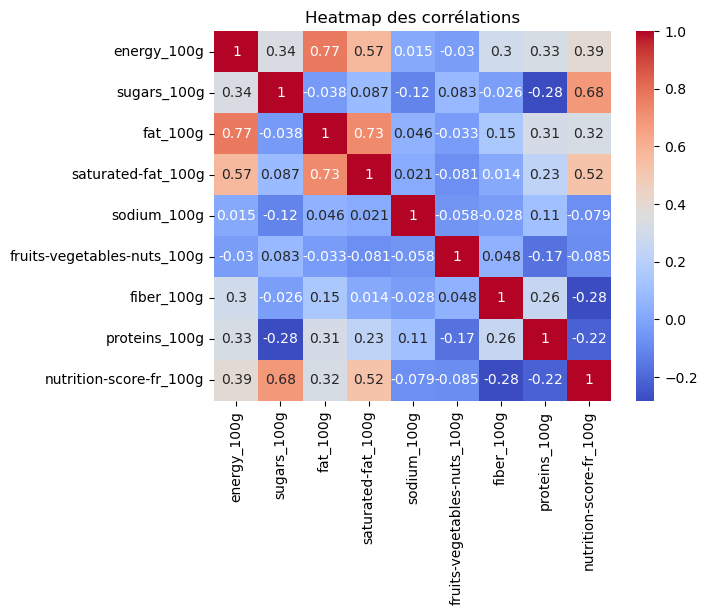

In [24]:
# heatmap sur les variables

corr_df = df.corr(method = 'pearson')
sns.heatmap(corr_df, annot = True , cmap = 'coolwarm')
plt.title('Heatmap des corrélations')
plt.show()

Les corrélations à noter :  (energy / fat), (fat / saturated-fat) et (sugars / nutrition-score)
    

##  <a name="A4">4) Analyse multi-variée</a>

L'analyse multi-variée donne une vision plus globale. On va mettre en parallèle plusieurs variables.

Affichons d'abord les variables corrélées (trouvées précédemment) en affichant en couleur le nutrigrade

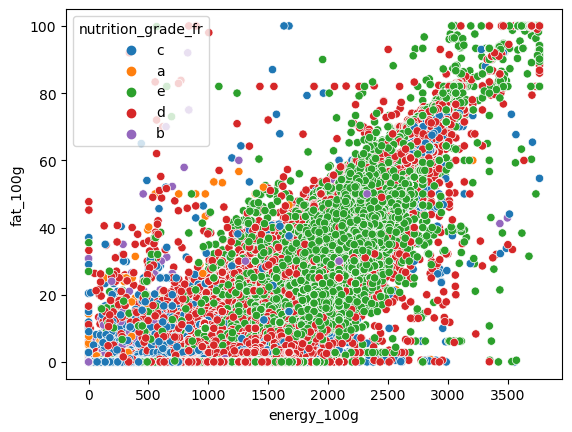

In [25]:
# energy et fat

sns.scatterplot(data = df, x = 'energy_100g', y = 'fat_100g', hue = 'nutrition_grade_fr')
plt.show()

On retrouve la corrélation. Plus energy augmente, plus fat aussi et plus la note est mauvaise.

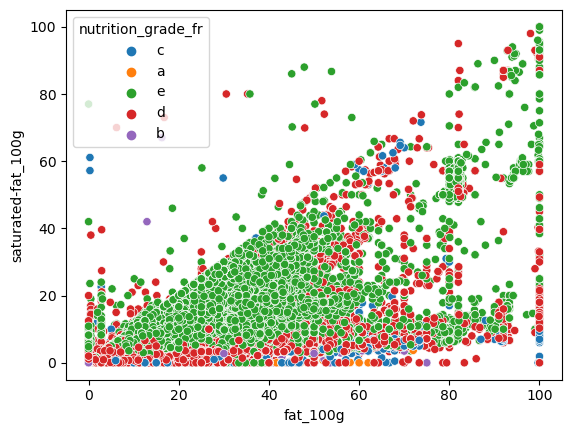

In [26]:
# fat et saturated-fat

sns.scatterplot(data = df, x = 'fat_100g', y = 'saturated-fat_100g', hue = 'nutrition_grade_fr')
plt.show()

On retrouve la même chose pour fat et saturated-fat

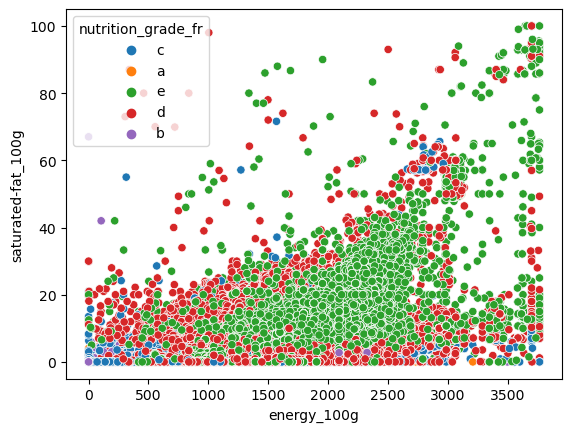

In [27]:
# energy et saturated-fat

sns.scatterplot(data = df, x = 'energy_100g', y = 'saturated-fat_100g', hue = 'nutrition_grade_fr')
plt.show()

La tendance se retrouve aussi entre energy et saturated-fat

###  <a name="A5">5) ACP</a>

L'analyse en composantes principales permet une réduction dimensionnelle. On peut créer des nouvelles variables (les composantes) composées à partir des anciennes.

Peut-on trouver des caractéristiques communes aux produits qui ont la même note ?

On centre et réduit le dataframe

In [28]:
# centrage réduction

df_bis = df[variables]
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_bis)

df_scaled = pd.DataFrame(df_scaled)
df_scaled.describe()

,0,1,2,3,4,5,6,7
count,2.344450e+05,2.344450e+05,2.344450e+05,2.344450e+05,2.344450e+05,2.344450e+05,2.344450e+05,2.344450e+05
mean,-1.125575e-14,-4.019945e-15,7.206895e-15,7.569920e-14,-2.140195e-14,1.028789e-13,-1.513257e-14,1.261476e-13
std,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00,1.000002e+00
min,-1.463324e+00,-7.640851e-01,-7.755386e-01,-6.280163e-01,-3.538537e-01,-6.127899e-01,-5.913414e-01,-9.578999e-01
25%,-9.574625e-01,-6.963472e-01,-7.630272e-01,-6.280163e-01,-3.279245e-01,-6.127899e-01,-5.913414e-01,-8.335229e-01
50%,-1.596216e-02,-4.907143e-01,-4.314753e-01,-4.446264e-01,-1.370858e-01,-3.231284e-01,-3.426043e-01,-2.669168e-01
75%,7.135706e-01,3.971358e-01,4.756005e-01,2.780655e-01,1.585069e-01,2.087956e-01,2.294910e-01,4.240664e-01
max,3.434039e+00,4.074335e+00,5.480157e+00,1.295642e+01,1.033629e+02,4.653784e+00,2.428237e+01,6.366521e+00


On entraîne l'ACP

In [29]:
#ACP

composantes = 6
pca = PCA(n_components = composantes )
pca.fit(df_scaled)

PCA(n_components=6)

On affiche l'inertie de chaque composante

In [30]:
pca.explained_variance_ratio_

array([0.32920626, 0.17820955, 0.13791063, 0.1184397 , 0.11084482,
       0.07065893])

On affiche l'inertie cumulée

In [31]:
var_donnees = (pca.explained_variance_ratio_*100).round(2)
var_donnees_cum = var_donnees.cumsum()
var_donnees_cum

array([32.92, 50.74, 64.53, 76.37, 87.45, 94.52])

On projette ces valeurs

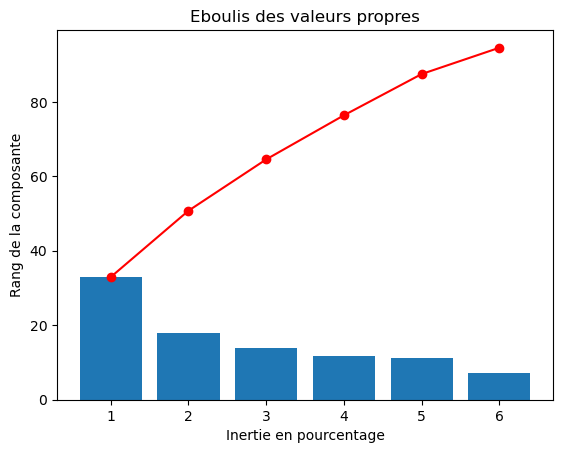

In [32]:
liste = [1,2,3,4,5,6]
plt.plot(liste,var_donnees_cum, color = 'red', marker = 'o')
plt.bar(x = liste, height = var_donnees)
plt.xlabel('Inertie en pourcentage')
plt.ylabel('Rang de la composante')
plt.title('Eboulis des valeurs propres')
plt.show()

On transforme en un dataframe

In [33]:
pcs = pca.components_
pcs = pd.DataFrame(pcs)
pcs

,0,1,2,3,4,5,6,7
0,0.547053,0.062538,0.556472,0.490262,0.043273,-0.071103,0.201101,0.315332
1,-0.208902,-0.676045,-0.022846,-0.107110,0.334791,-0.326496,0.127697,0.502333
2,-0.069398,0.032281,0.112410,0.298185,0.298732,-0.423183,-0.765327,-0.196318
3,0.011910,-0.053972,0.082652,0.016151,0.731952,0.664226,-0.039146,-0.106634
4,0.172390,0.529144,-0.234183,-0.241740,0.504807,-0.461711,0.330150,0.001163
5,-0.098188,-0.332261,0.204163,0.180728,0.070368,-0.226439,0.439306,-0.745922


On affiche le nom des lignes et colonnes

In [34]:
pcs.columns = variables
pcs.index = [f"F{i}" for i in liste]
pcs

,energy_100g,sugars_100g,fat_100g,saturated-fat_100g,sodium_100g,fruits-vegetables-nuts_100g,fiber_100g,proteins_100g
F1,0.547053,0.062538,0.556472,0.490262,0.043273,-0.071103,0.201101,0.315332
F2,-0.208902,-0.676045,-0.022846,-0.107110,0.334791,-0.326496,0.127697,0.502333
F3,-0.069398,0.032281,0.112410,0.298185,0.298732,-0.423183,-0.765327,-0.196318
F4,0.011910,-0.053972,0.082652,0.016151,0.731952,0.664226,-0.039146,-0.106634
F5,0.172390,0.529144,-0.234183,-0.241740,0.504807,-0.461711,0.330150,0.001163
F6,-0.098188,-0.332261,0.204163,0.180728,0.070368,-0.226439,0.439306,-0.745922


On transpose

In [35]:
pcs.T

,F1,F2,F3,F4,F5,F6
energy_100g,0.547053,-0.208902,-0.069398,0.011910,0.172390,-0.098188
sugars_100g,0.062538,-0.676045,0.032281,-0.053972,0.529144,-0.332261
fat_100g,0.556472,-0.022846,0.112410,0.082652,-0.234183,0.204163
saturated-fat_100g,0.490262,-0.107110,0.298185,0.016151,-0.241740,0.180728
sodium_100g,0.043273,0.334791,0.298732,0.731952,0.504807,0.070368
fruits-vegetables-nuts_100g,-0.071103,-0.326496,-0.423183,0.664226,-0.461711,-0.226439
fiber_100g,0.201101,0.127697,-0.765327,-0.039146,0.330150,0.439306
proteins_100g,0.315332,0.502333,-0.196318,-0.106634,0.001163,-0.745922


On affiche la heatmap des corrélations entre les variables quantitatives et les composantes

Text(0.5, 1.0, 'Heatmap des corrélations')

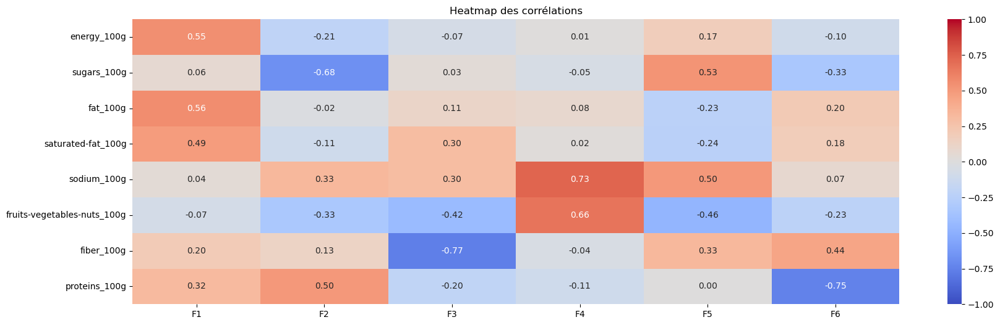

In [36]:
ig, ax = plt.subplots(figsize=(20, 6))
sns.heatmap(pcs.T, vmin=-1, vmax=1, annot=True, cmap="coolwarm", fmt="0.2f")
plt.title('Heatmap des corrélations')

On peut noter :
   - les corrélations :  (sodium/F4), (energy/F1) et (fat/F1)
   - les anti-corrélations :   (fiber/F3), (sugars/F2), (fruits/F5) et (proteins/F6)

Fonction qui affiche le cercle des corrélations (recopié du cours)

In [37]:
def correlation_graph(pca, 
                      x_y, 
                      features) : 
    """Affiche le graphe des correlations

    Positional arguments : 
    -----------------------------------
    pca : sklearn.decomposition.PCA : notre objet PCA qui a été fit
    x_y : list ou tuple : le couple x,y des plans à afficher, exemple [0,1] pour F1, F2
    features : list ou tuple : la liste des features (ie des dimensions) à représenter
    """

    # Extrait x et y 
    x,y=x_y

    # Taille de l'image (en inches)
    fig, ax = plt.subplots(figsize=(10, 9))

    # Pour chaque composante : 
    for i in range(0, pca.components_.shape[1]):

        # Les flèches
        ax.arrow(0,0, 
                pca.components_[x, i],  
                pca.components_[y, i],  
                head_width=0.07,
                head_length=0.07, 
                width=0.02, )

        # Les labels
        plt.text(pca.components_[x, i] + 0.05,
                pca.components_[y, i] + 0.05,
                features[i])
        
    # Affichage des lignes horizontales et verticales
    plt.plot([-1, 1], [0, 0], color='grey', ls='--')
    plt.plot([0, 0], [-1, 1], color='grey', ls='--')

    # Nom des axes, avec le pourcentage d'inertie expliqué
    plt.xlabel('F{} ({}%)'.format(x+1, round(100*pca.explained_variance_ratio_[x],1)))
    plt.ylabel('F{} ({}%)'.format(y+1, round(100*pca.explained_variance_ratio_[y],1)))

    plt.title("Cercle des corrélations (F{} et F{})".format(x+1, y+1))

    # Le cercle 
    an = np.linspace(0, 2 * np.pi, 100)
    plt.plot(np.cos(an), np.sin(an))  # Add a unit circle for scale

    # Axes et display
    plt.axis('equal')
    plt.show(block=False)

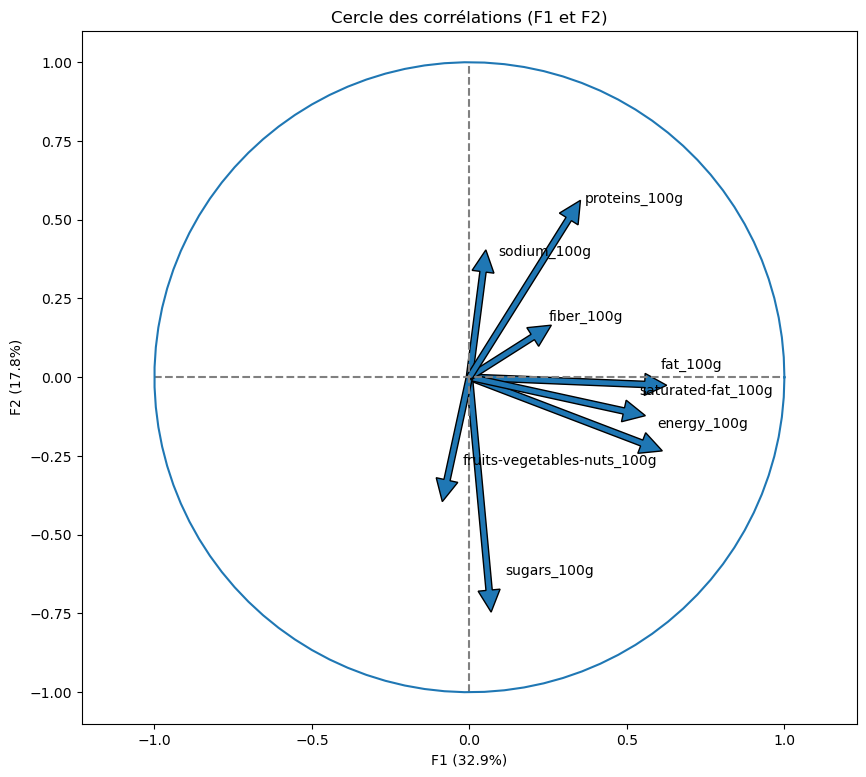

In [38]:
correlation_graph(pca,(0,1),variables)

L'axe F1 pourrait être associé aux produits riches (caloriques et gras).

L'axe F2 pourrait être associé aux produits sans sucre.

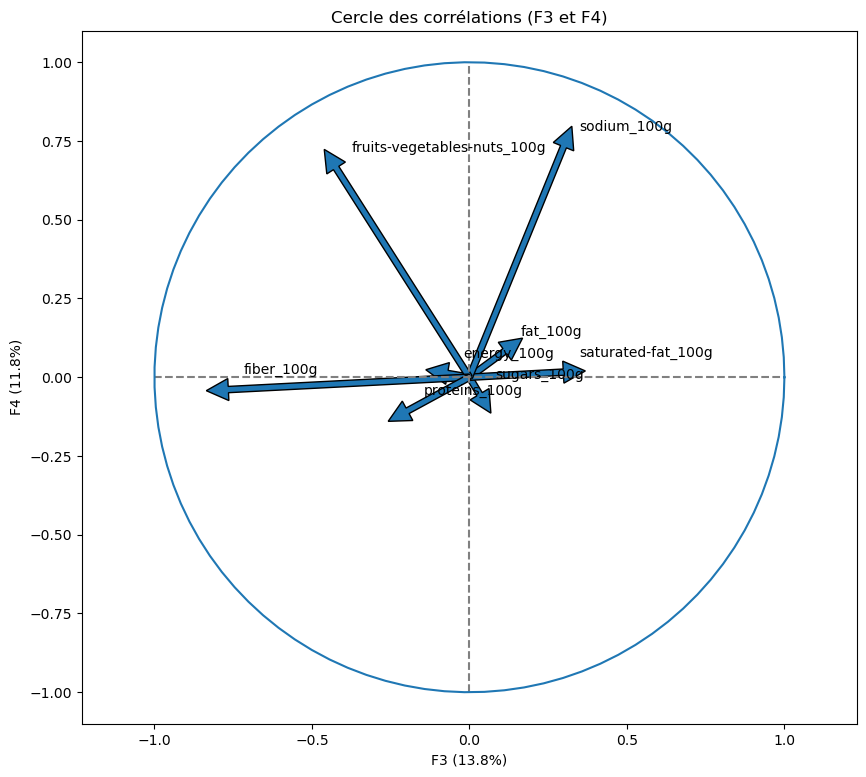

In [39]:
correlation_graph(pca,(2,3),variables)

L'axe F3 pourrait être associé aux produits mauvais pour la santé (les 3 "bonnes" variables sont anti-corrélées)

L'axe F4 pourrait être associé aux produits salés.

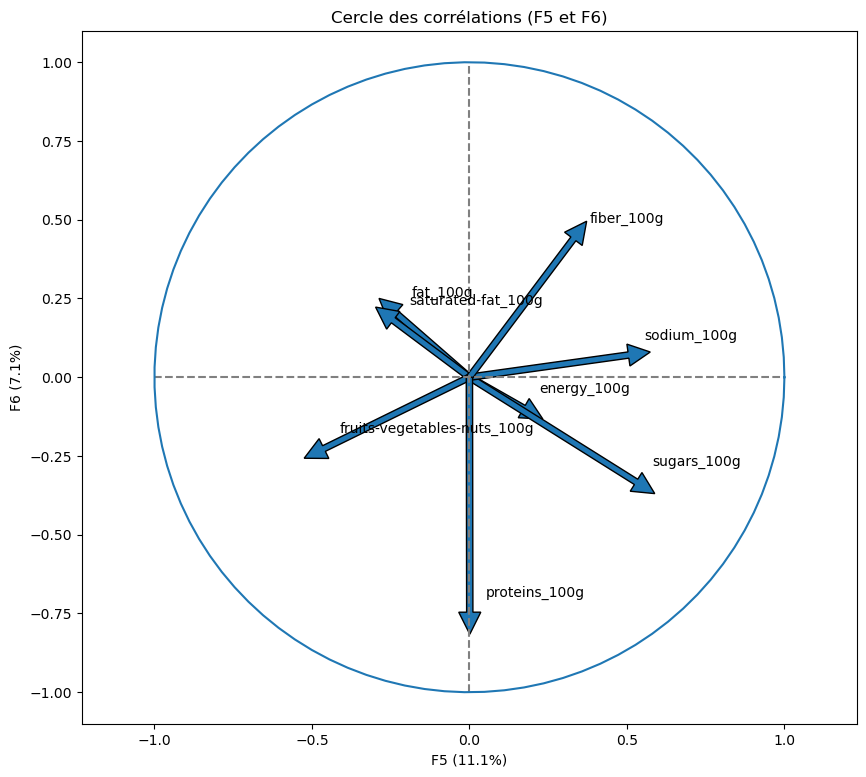

In [40]:
correlation_graph(pca,(4,5),variables)

Passons à la projection des individus

In [41]:
df_proj = pca.transform(df_scaled)
df_proj

array([[ 2.69413579,  0.96230829, -2.63109442,  1.28613114, -0.82797391,
        -1.15919569],
       [ 1.84338877,  0.78822215,  0.36108517, -0.38069113, -0.3931662 ,
        -0.52077131],
       [ 1.04288407,  2.45761447, -2.8422305 , -1.10924732,  1.00518959,
        -1.00573241],
       ...,
       [-0.99332685,  0.06297676,  1.02963843,  0.90487482,  0.98200496,
         0.39197751],
       [-0.99332685,  0.06297676,  1.02963843,  0.90487482,  0.98200496,
         0.39197751],
       [ 2.31744965,  2.63800363,  0.56908372,  0.66230422,  0.05503634,
        -2.30330004]])

Focntion qui affiche la projection des produits sur les composantes choisies

In [42]:
def display_factorial_planes(   X_projected, 
                                x_y, 
                                pca=None, 
                                labels = None,
                                clusters=None, 
                                alpha=1,
                                figsize=[10,8], 
                                marker="." ,
                                note = None):
    """
    Affiche la projection des individus

    Positional arguments : 
    -------------------------------------
    X_projected : np.array, pd.DataFrame, list of list : la matrice des points projetés
    x_y : list ou tuple : le couple x,y des plans à afficher, exemple [0,1] pour F1, F2

    Optional arguments : 
    -------------------------------------
    pca : sklearn.decomposition.PCA : un objet PCA qui a été fit, cela nous permettra d'afficher la variance de chaque composante, default = None
    labels : list ou tuple : les labels des individus à projeter, default = None
    clusters : list ou tuple : la liste des clusters auquel appartient chaque individu, default = None
    alpha : float in [0,1] : paramètre de transparence, 0=100% transparent, 1=0% transparent, default = 1
    figsize : list ou tuple : couple width, height qui définit la taille de la figure en inches, default = [10,8] 
    marker : str : le type de marker utilisé pour représenter les individus, points croix etc etc, default = "."
    """

    # Transforme X_projected en np.array
    X_ = np.array(X_projected)

    # On définit la forme de la figure si elle n'a pas été donnée
    if not figsize: 
        figsize = (7,6)

    # On gère les labels
    if  labels is None : 
        labels = []
    try : 
        len(labels)
    except Exception as e : 
        raise e

    # On vérifie la variable axis 
    if not len(x_y) ==2 : 
        raise AttributeError("2 axes sont demandées")   
    if max(x_y )>= X_.shape[1] : 
        raise AttributeError("la variable axis n'est pas bonne")   

    # on définit x et y 
    x, y = x_y

    # Initialisation de la figure       
    fig, ax = plt.subplots(1, 1, figsize=figsize)

    # On vérifie s'il y a des clusters ou non
    c = None if clusters is None else clusters
 
    # Les points    
    # plt.scatter(   X_[:, x], X_[:, y], alpha=alpha, 
    #                     c=c, cmap="Set1", marker=marker)
    sns.scatterplot(data=None, x=X_[:, x], y=X_[:, y], hue= c)

    # Si la variable pca a été fournie, on peut calculer le % de variance de chaque axe 
    if pca : 
        v1 = str(round(100*pca.explained_variance_ratio_[x]))  + " %"
        v2 = str(round(100*pca.explained_variance_ratio_[y]))  + " %"
    else : 
        v1=v2= ''

    # Nom des axes, avec le pourcentage d'inertie expliqué
    ax.set_xlabel(f'F{x+1} ({v1})')
    ax.set_ylabel(f'F{y+1} ({v2})')

    # Valeur x max et y max
    x_max = np.abs(X_[:, x]).max() *1.1
    y_max = np.abs(X_[:, y]).max() *1.1

    # On borne x et y 
    ax.set_xlim(left=-x_max, right=x_max)
    ax.set_ylim(bottom= -y_max, top=y_max)

    # Affichage des lignes horizontales et verticales
    plt.plot([-x_max, x_max], [0, 0], color='grey', alpha=0.8)
    plt.plot([0,0], [-y_max, y_max], color='grey', alpha=0.8)

    # Affichage des labels des points
    if len(labels) : 
        for i,(_x,_y) in enumerate(X_[:,[x,y]]):
            plt.text(_x, _y+0.05, labels[i], fontsize='14', ha='center',va='center') 

    # Titre et display
    plt.suptitle(f"Projection des individus (sur F{x+1} et F{y+1})")
    if note != None :
        plt.title("Produits notés " + note)
    plt.show()



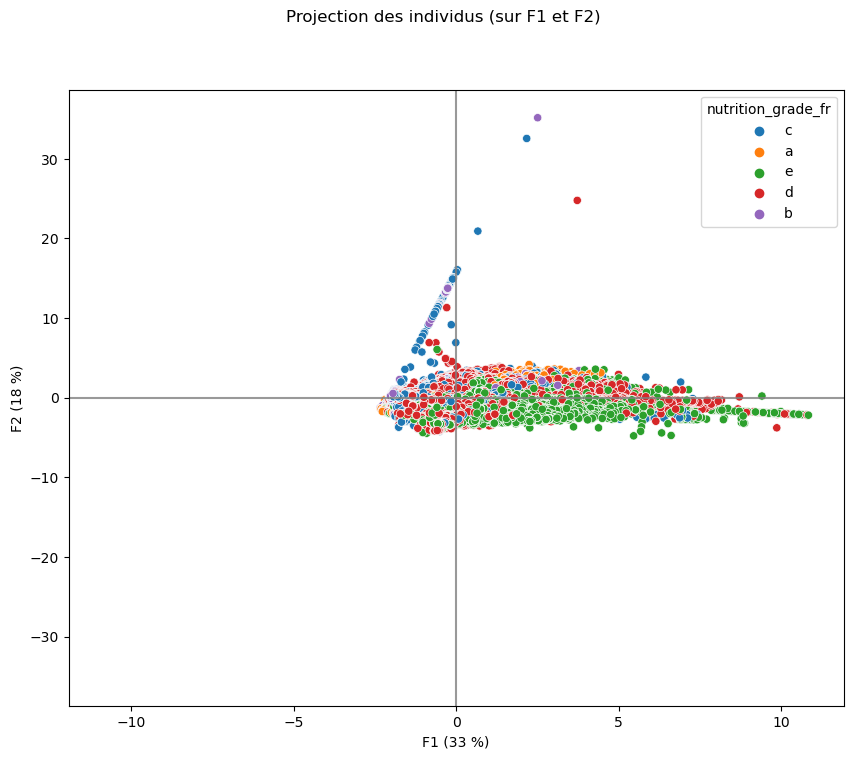

In [43]:
display_factorial_planes(df_proj , (0,1), pca = pca , clusters = df['nutrition_grade_fr'] ) 

Les produits sont plutôt répartis sur F1, plus de variablité sur la "richesse" des produits.

On trouve presque autant de points au-dessus qu'en dessous de F2, soit autant de produits sucrés que non sucrés.

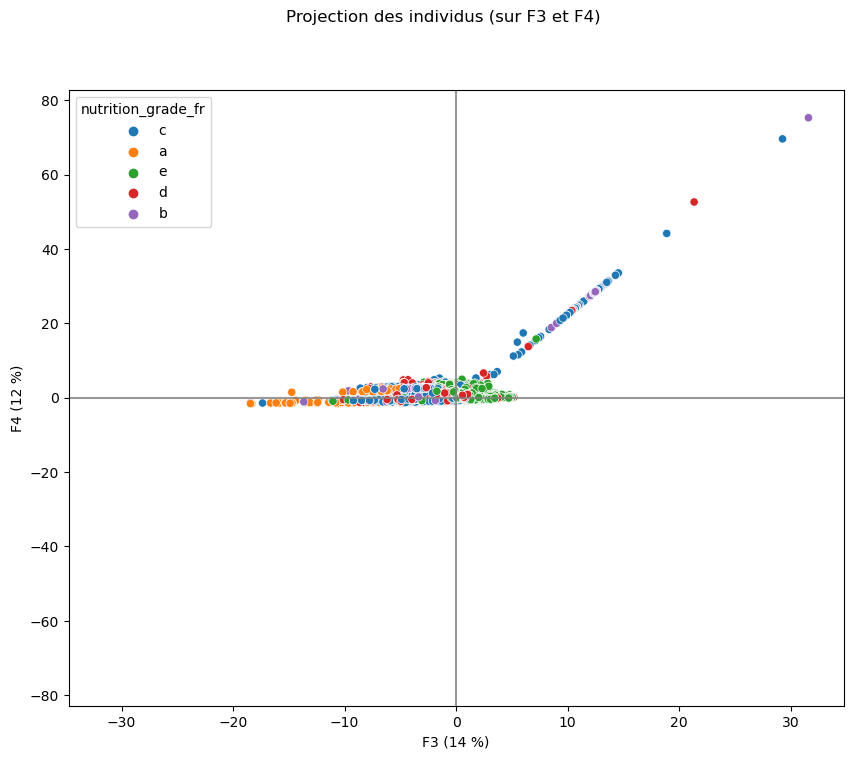

In [44]:
display_factorial_planes(df_proj , (2,3), pca = pca , clusters = df['nutrition_grade_fr'] ) 

On voit plus de points à gauche de F3, soit plus de produits sains. A noter la présence importante des produits notés e à droite de F3.

On voit plus de points au dessus de F4, soit plus de produits salés.

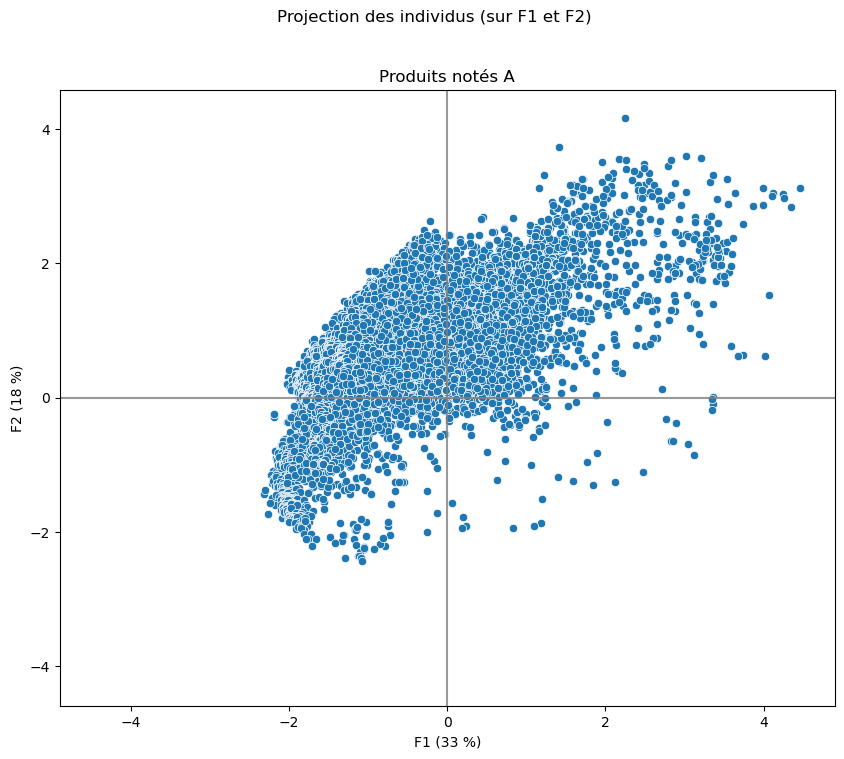

In [45]:
nutri_a = pd.DataFrame(df_proj).loc[df['nutrition_grade_fr']=='a']
display_factorial_planes(nutri_a , (0,1), pca = pca ,note = 'A') 

Projection des produits notés A sur F1 et F2. On voit plus de points dans la partie haute, soit les produits non sucrés

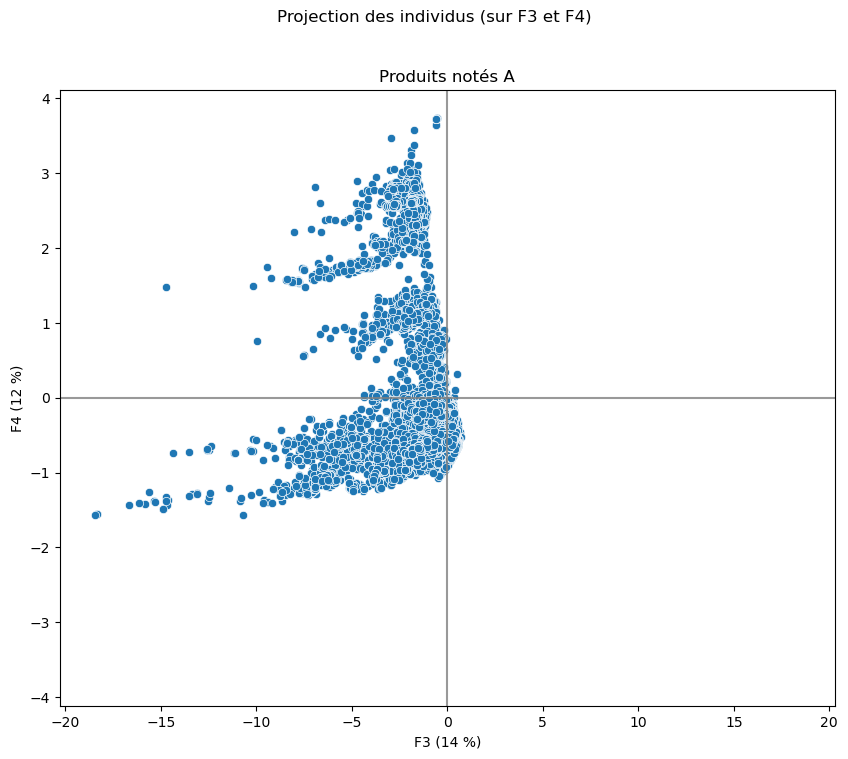

In [46]:
nutri_a = pd.DataFrame(df_proj).loc[df['nutrition_grade_fr']=='a']
display_factorial_planes(nutri_a , (2,3), pca = pca , note = 'A' ) 

Projection des produits notés A sur F3 et F4. On voit la quasi-totalité des points sur la partie gauche. C'est cohérent, l'axe F3 était associé aux produits "mauvais" pour la santé. 

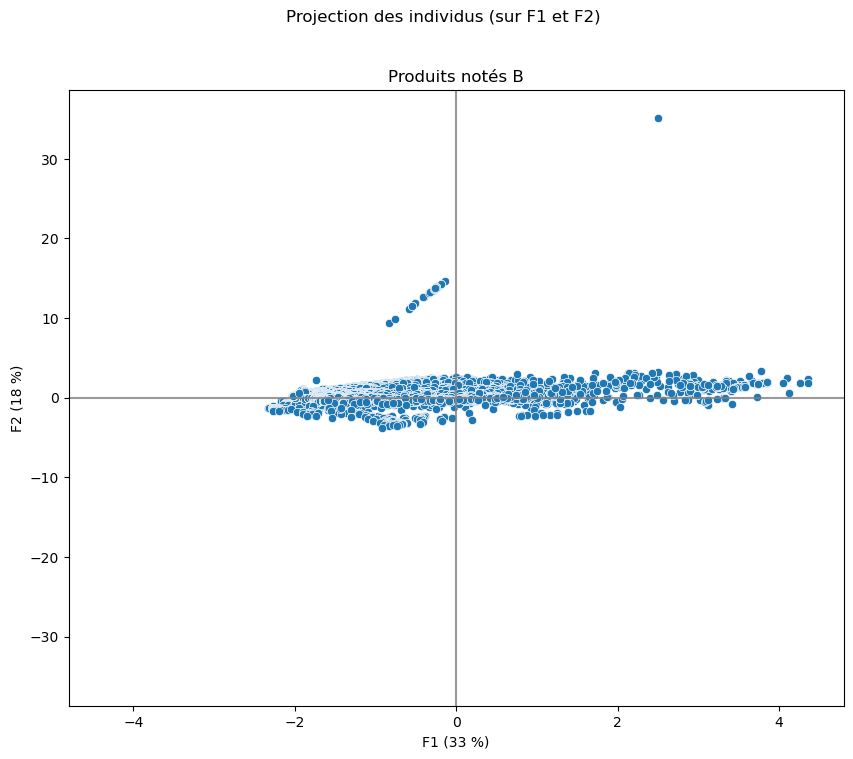

In [47]:
nutri_b = pd.DataFrame(df_proj).loc[df['nutrition_grade_fr']=='b']
display_factorial_planes(nutri_b , (0,1), pca = pca , note = 'B' ) 

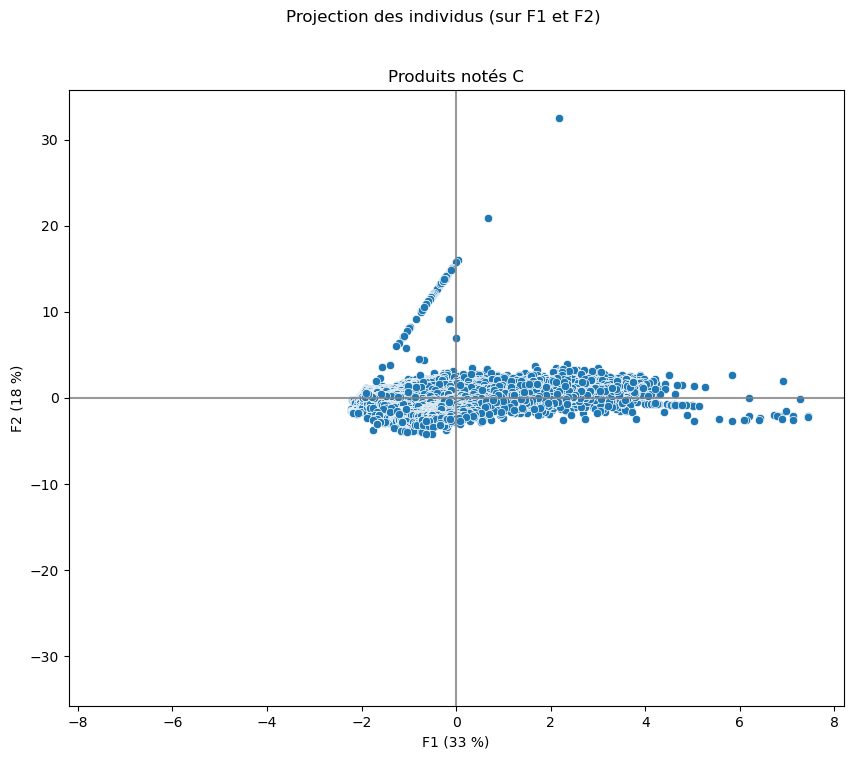

In [48]:
nutri_c = pd.DataFrame(df_proj).loc[df['nutrition_grade_fr']=='c']
display_factorial_planes(nutri_c , (0,1), pca = pca, note = 'C' ) 

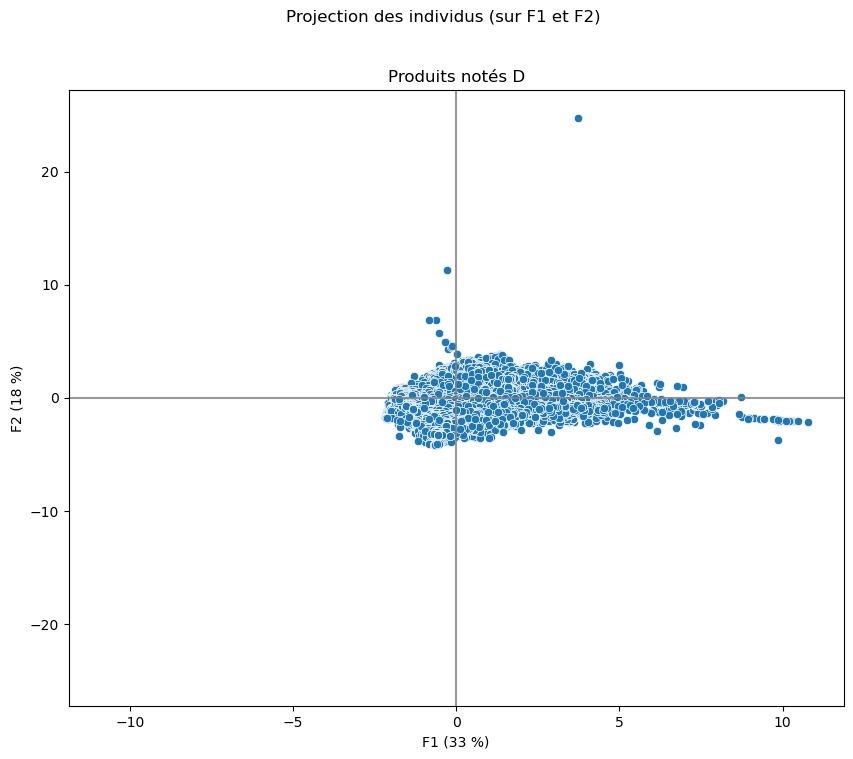

In [49]:
nutri_d = pd.DataFrame(df_proj).loc[df['nutrition_grade_fr']=='d']
display_factorial_planes(nutri_d , (0,1), pca = pca , note = 'D' ) 

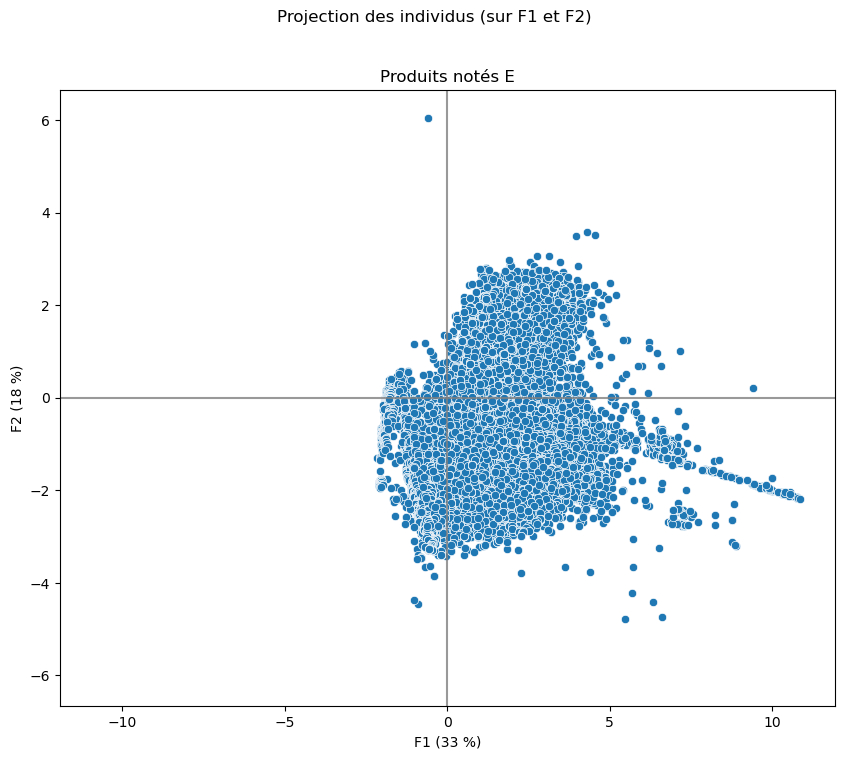

In [50]:
nutri_e = pd.DataFrame(df_proj).loc[df['nutrition_grade_fr']=='e']
display_factorial_planes(nutri_e , (0,1), pca = pca , note = 'E') 

 La grande majorité des points sont sur la partie droite. C'est cohérent, l'axe F1 représente les produits caloriques.

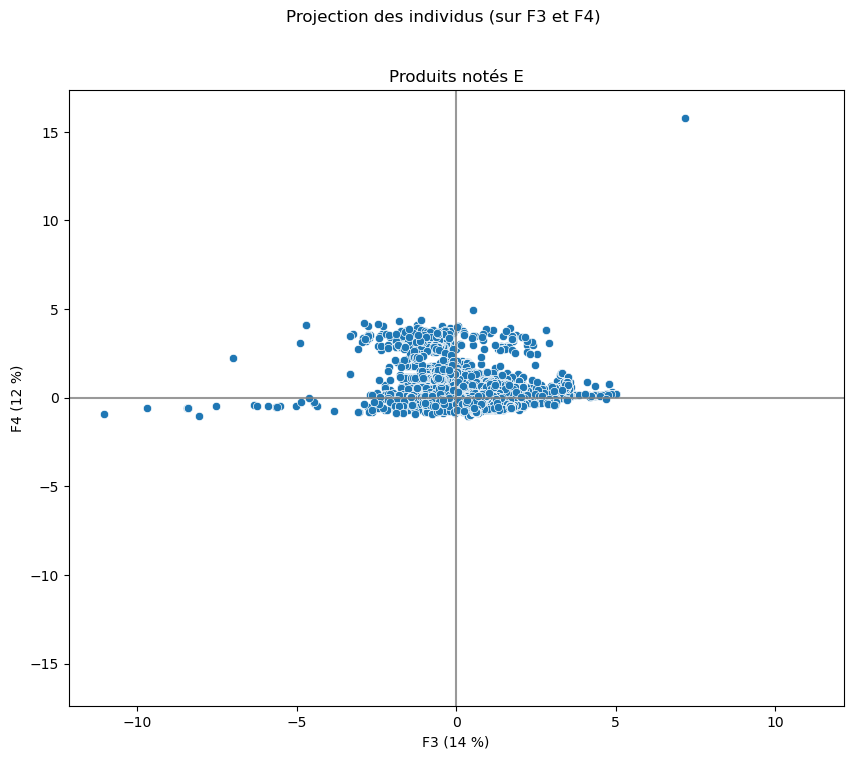

In [51]:
nutri_e = pd.DataFrame(df_proj).loc[df['nutrition_grade_fr']=='e']
display_factorial_planes(nutri_e , (2,3), pca = pca , note = 'E') 

La grande majorité des points sont sur la partie haute, soit les produits salés.

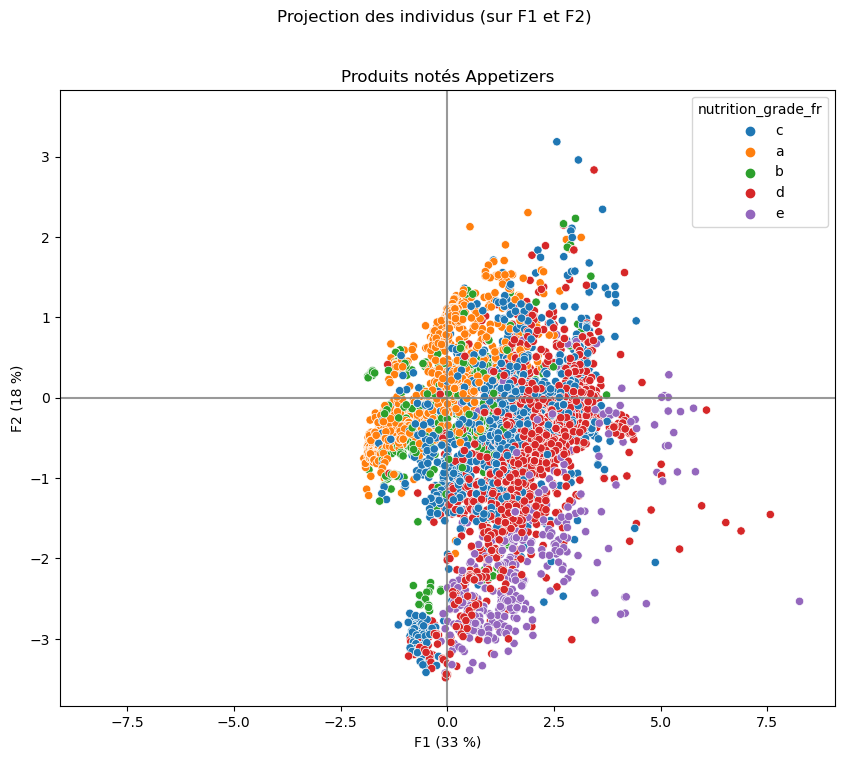

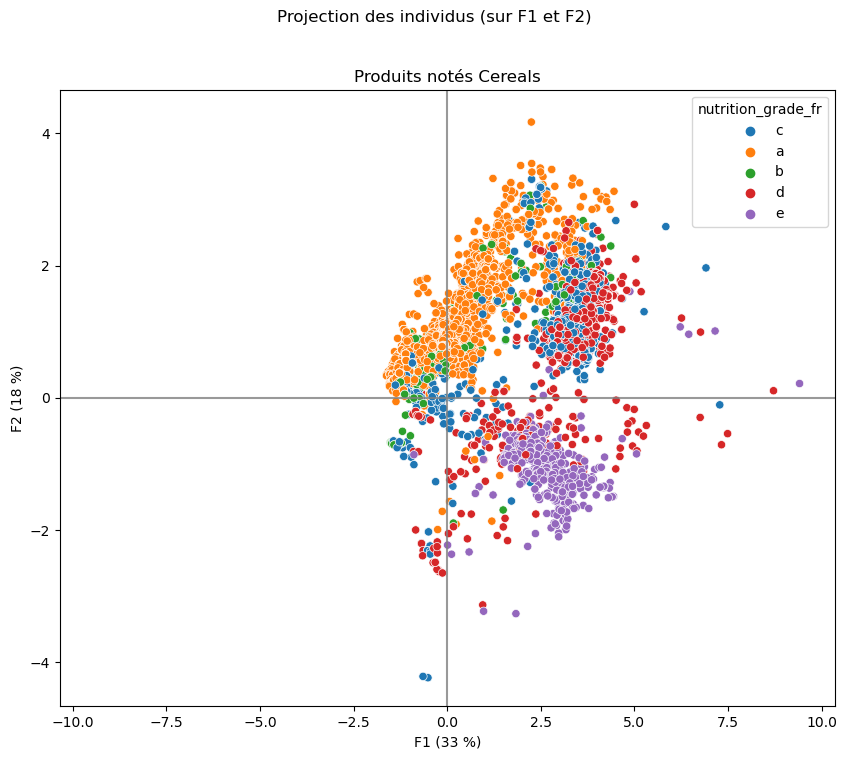

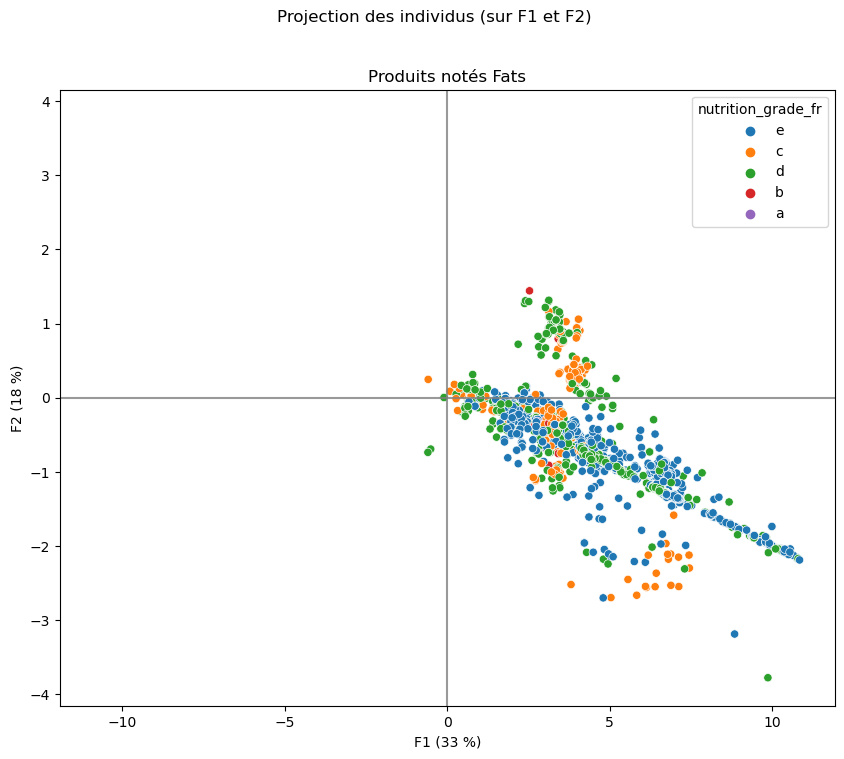

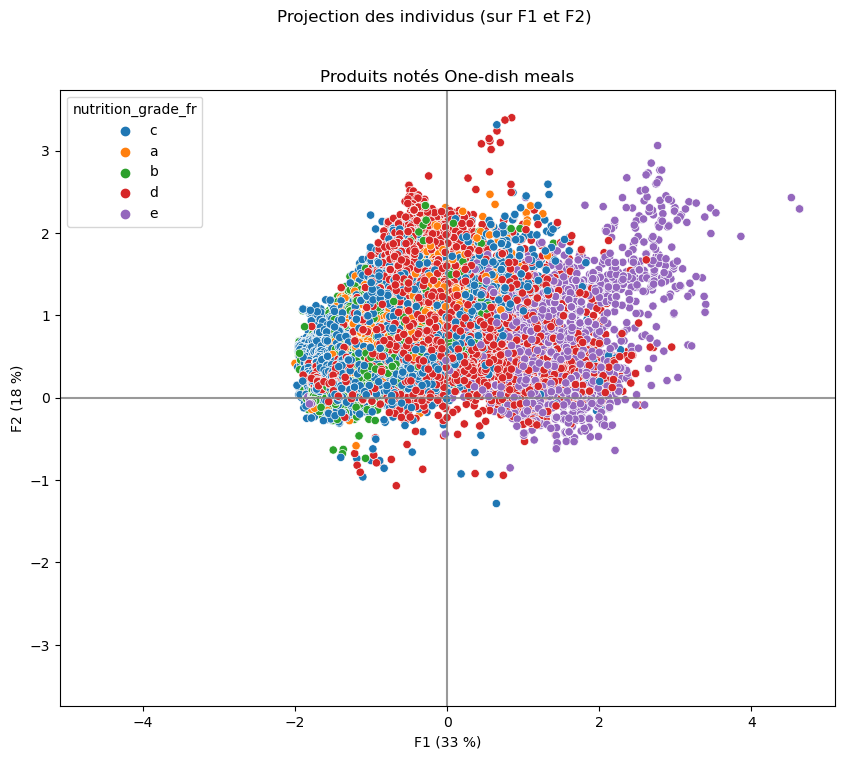

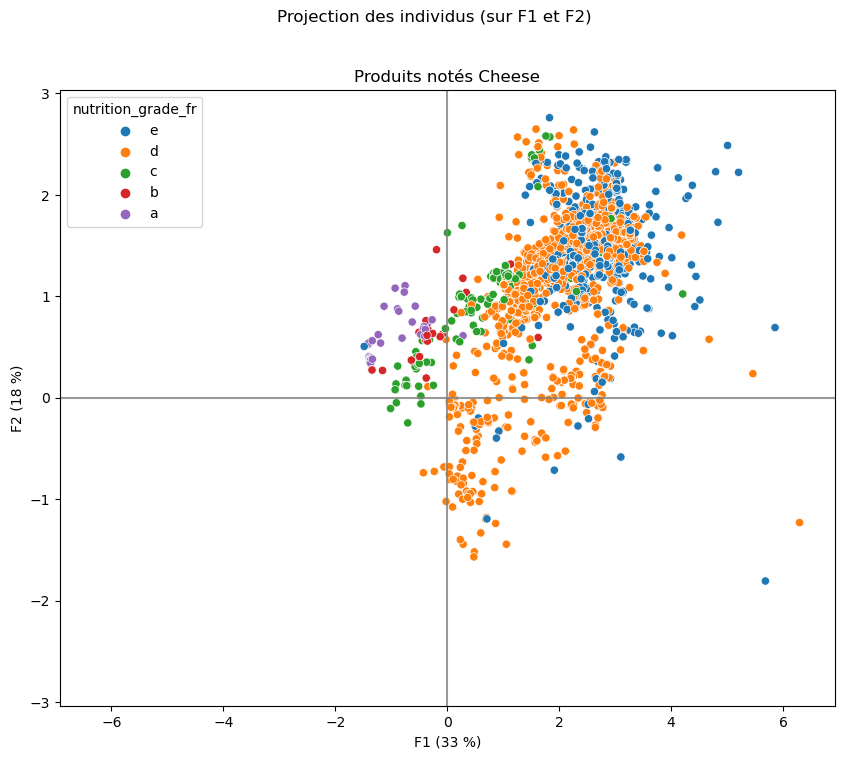

...

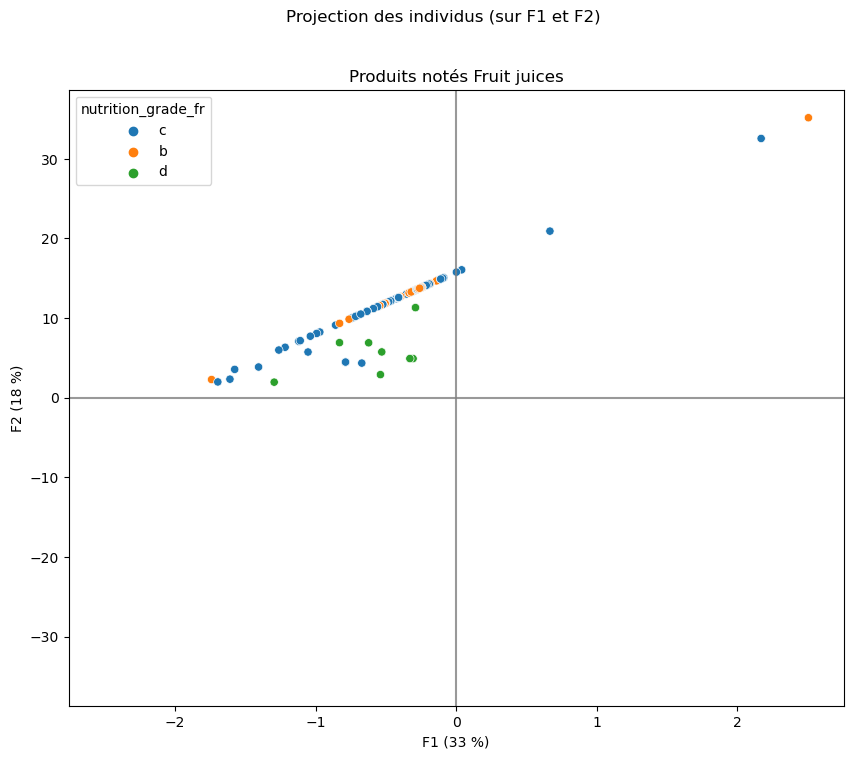

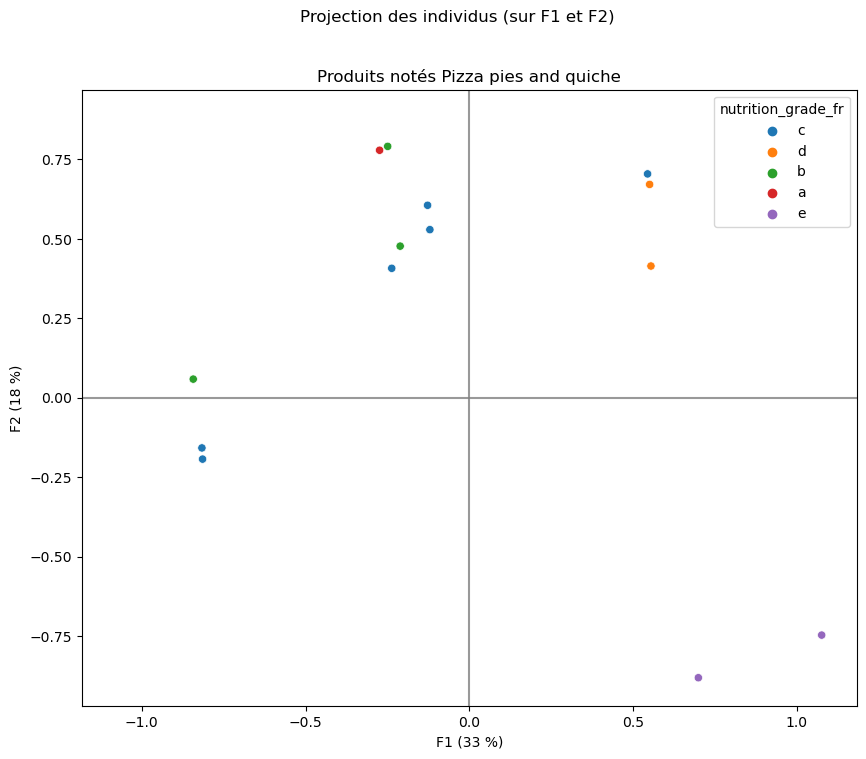

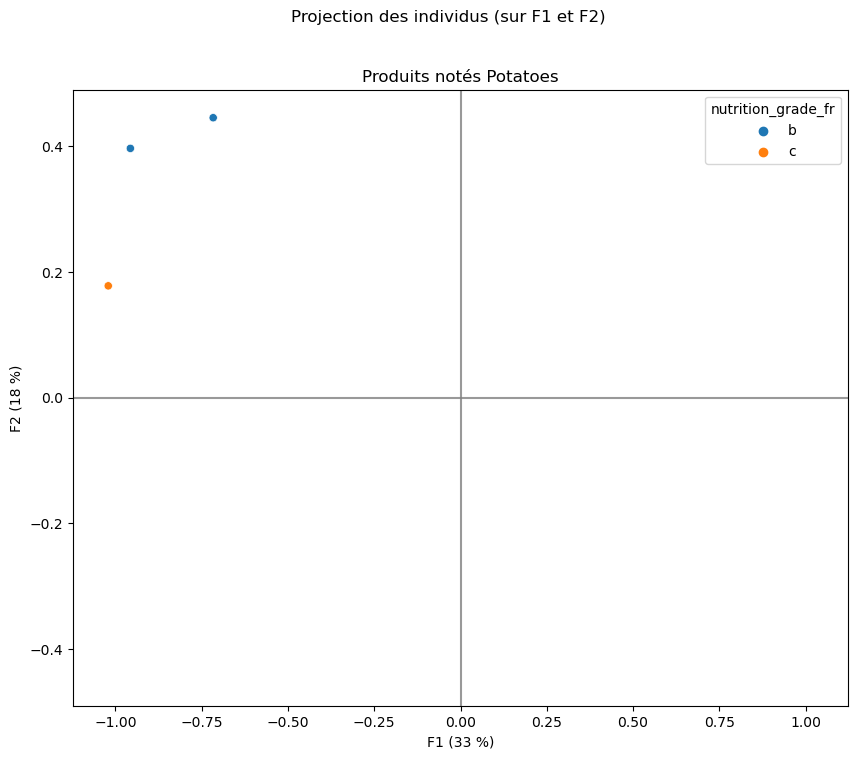

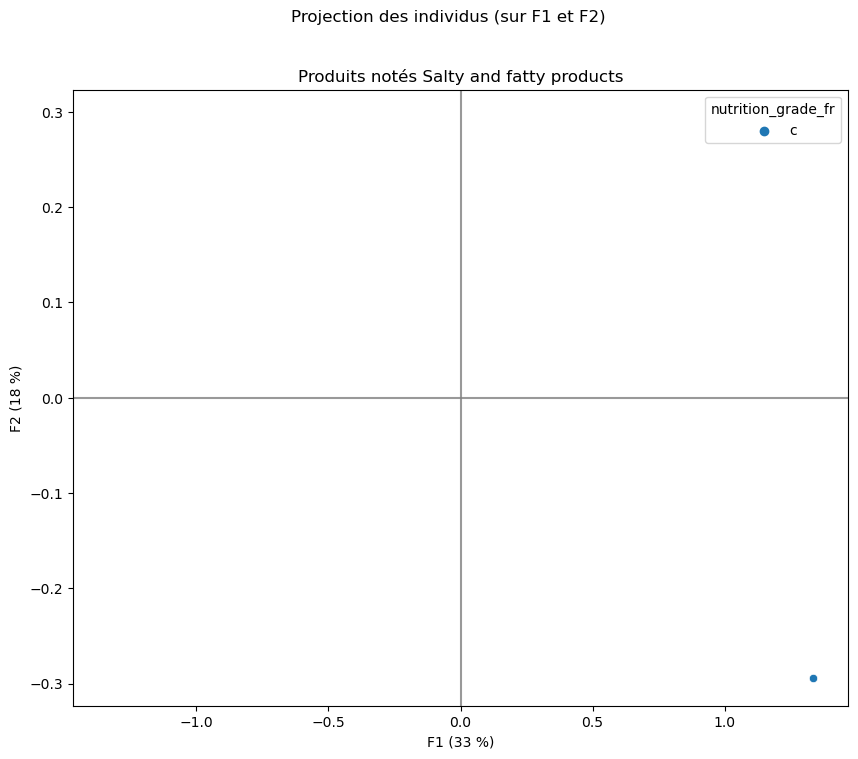

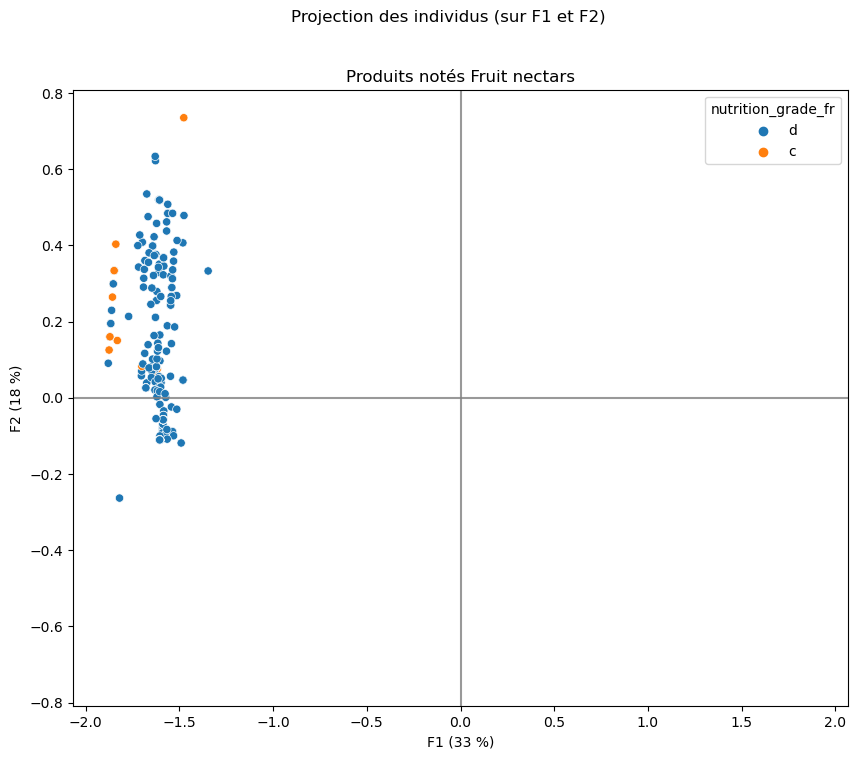

In [52]:
for cat in groupes :
    nutri_cat = pd.DataFrame(df_proj).loc[df['pnns_groups_2']==cat]
    display_factorial_planes(nutri_cat , (0,1), pca = pca , note = cat, clusters = df.loc[df['pnns_groups_2'] == cat, 'nutrition_grade_fr']) 

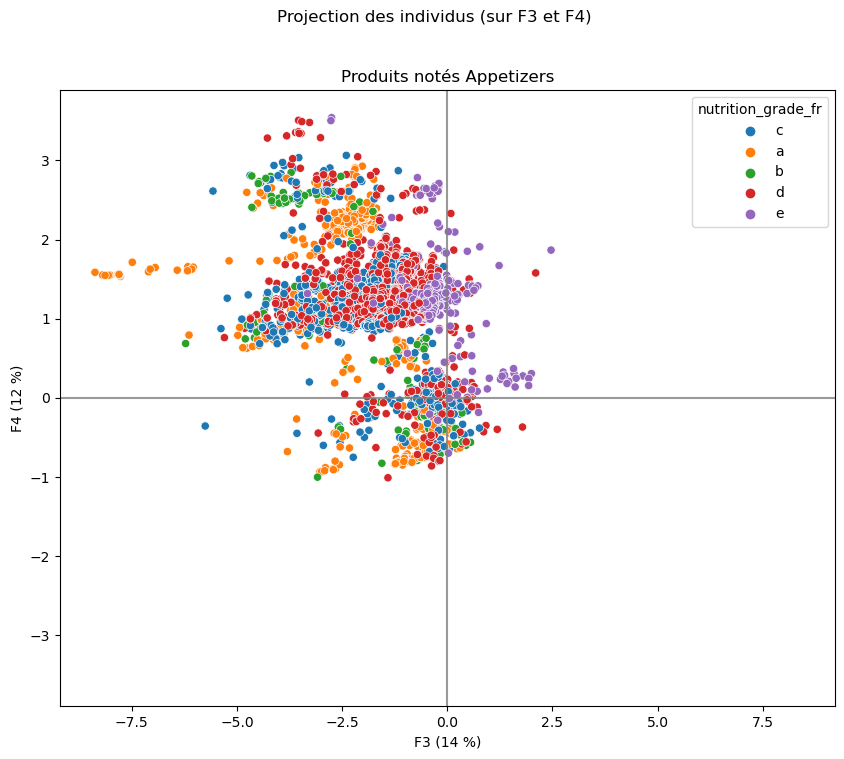

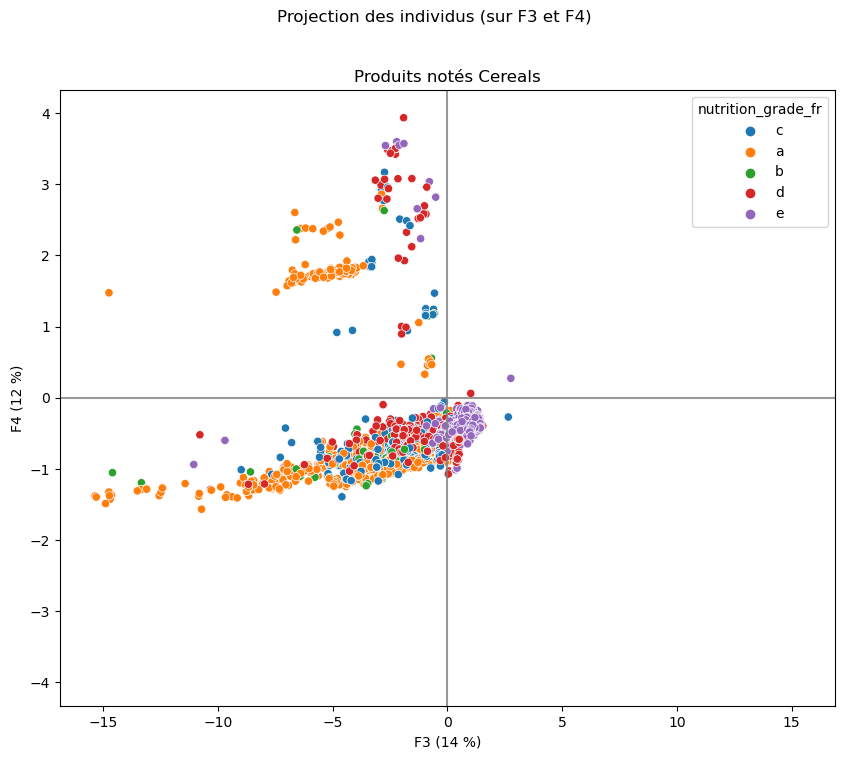

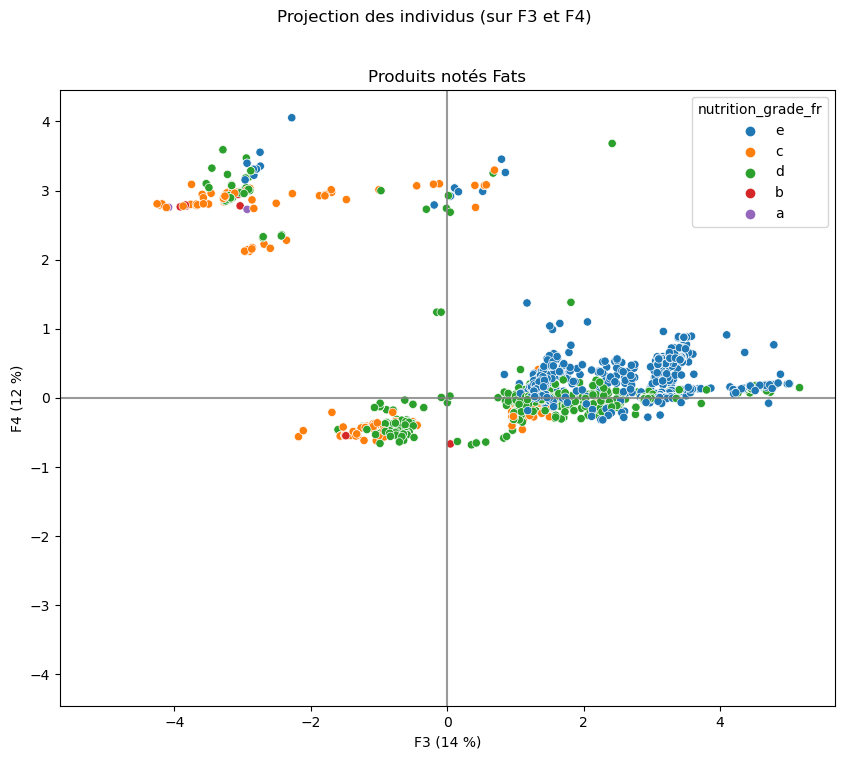

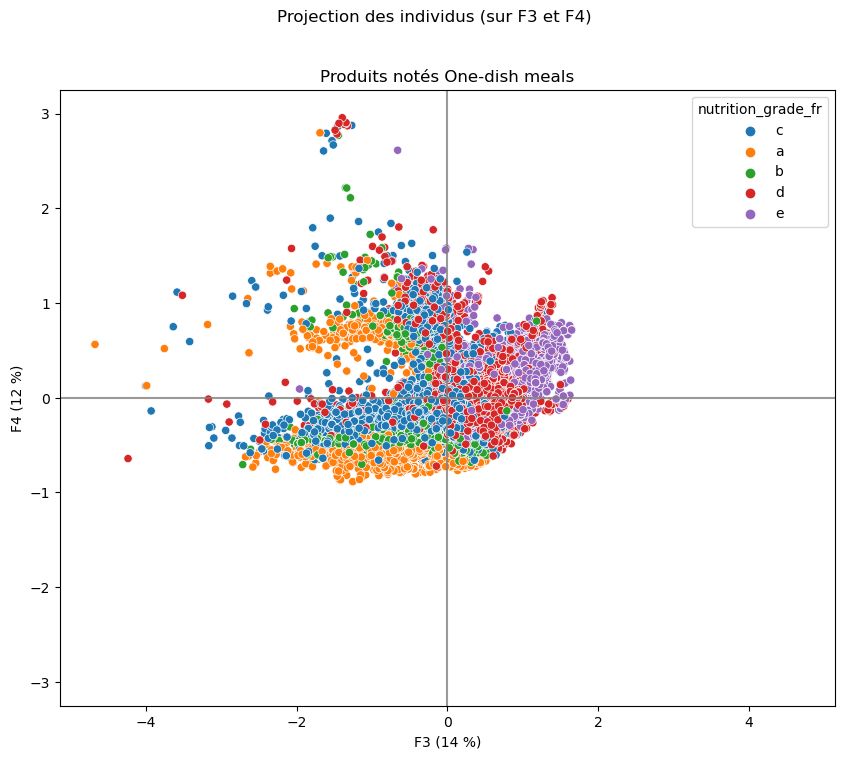

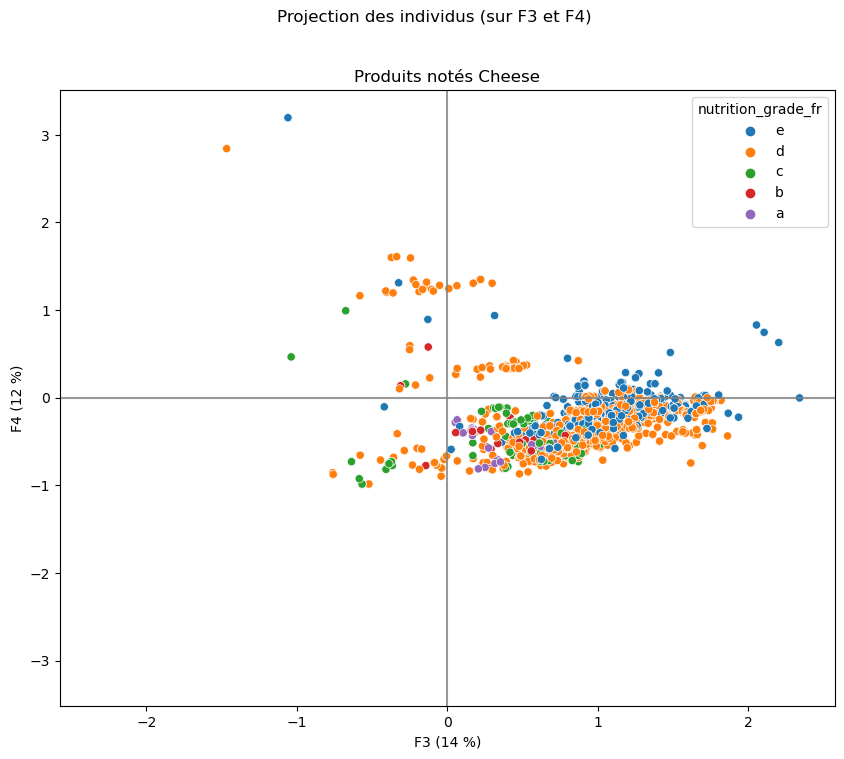

...

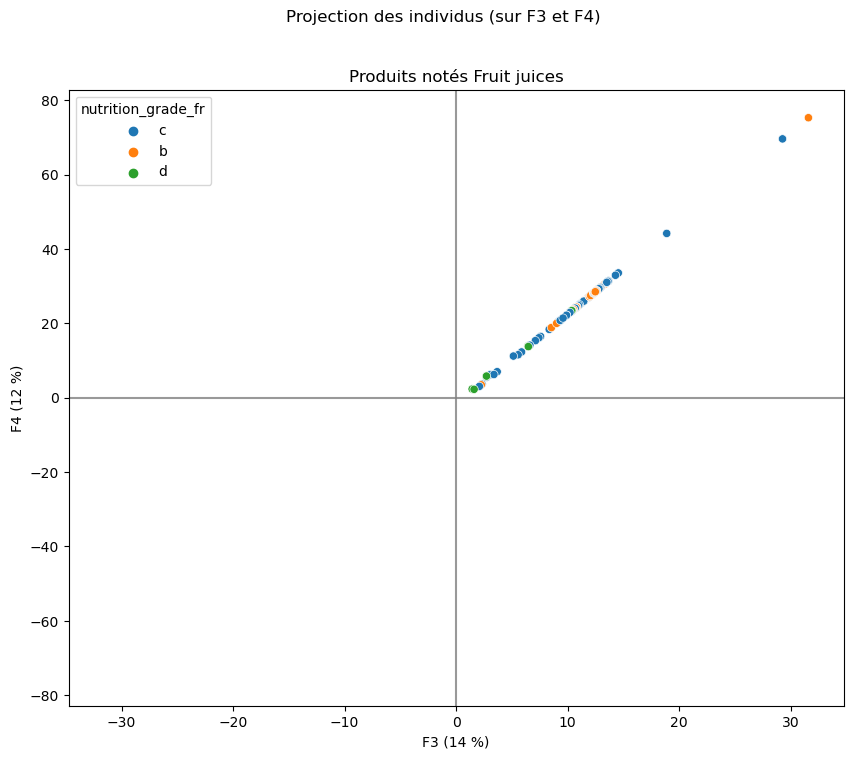

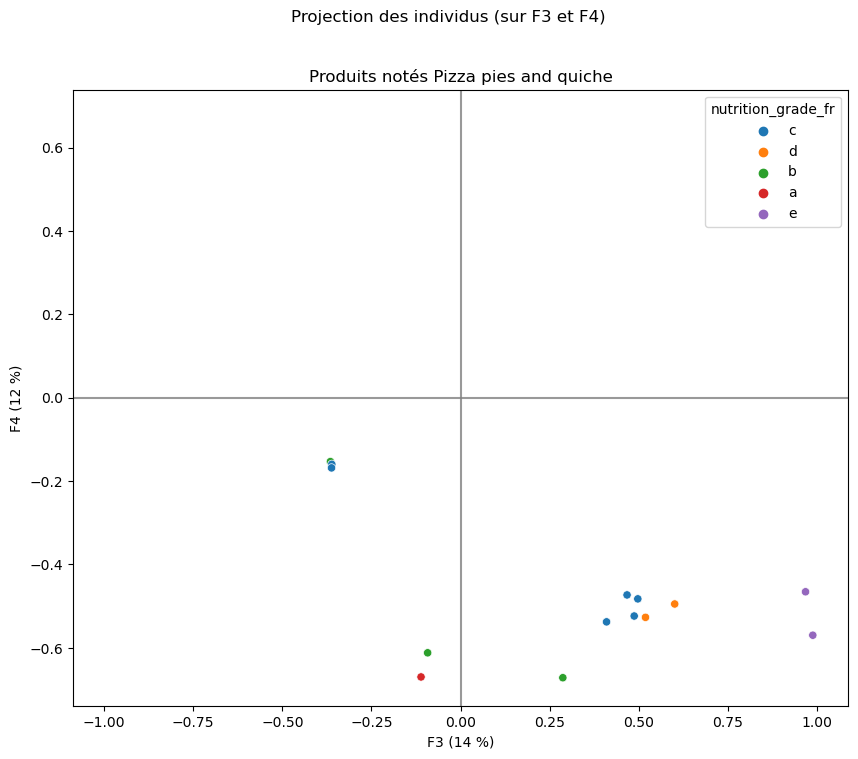

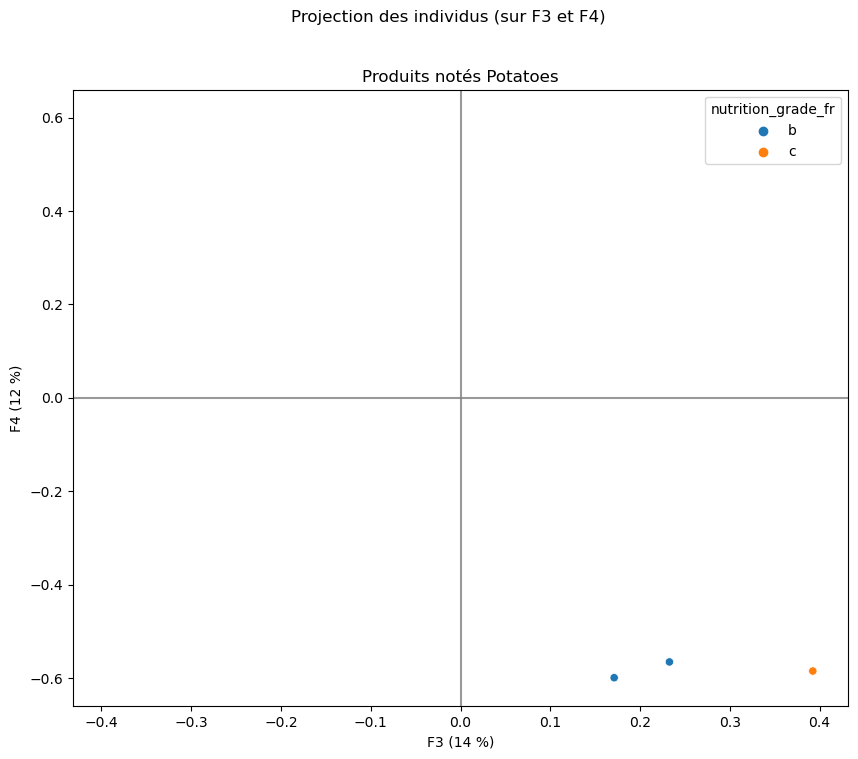

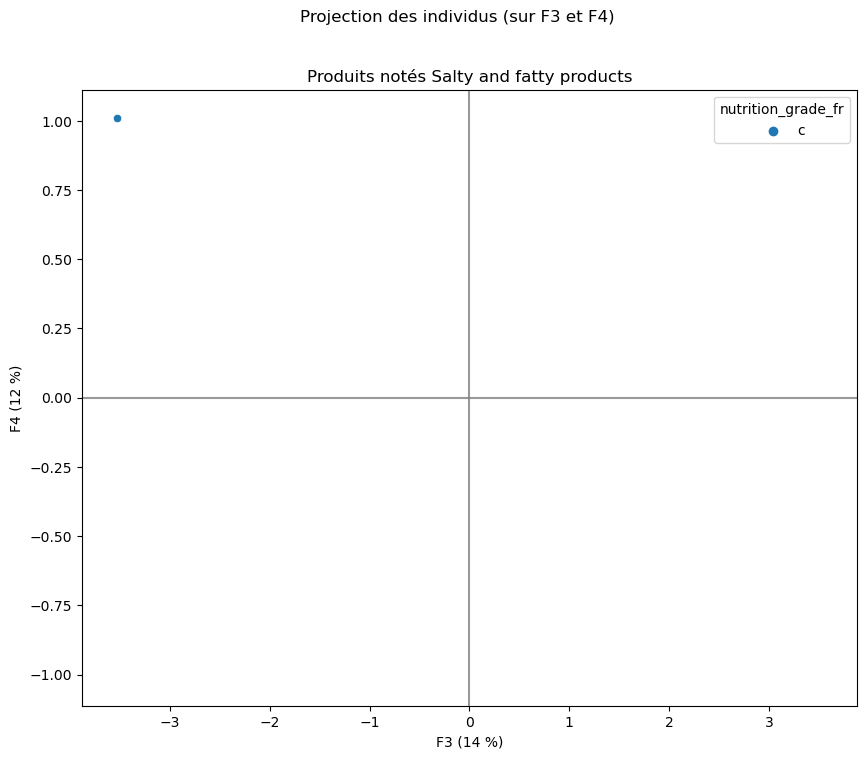

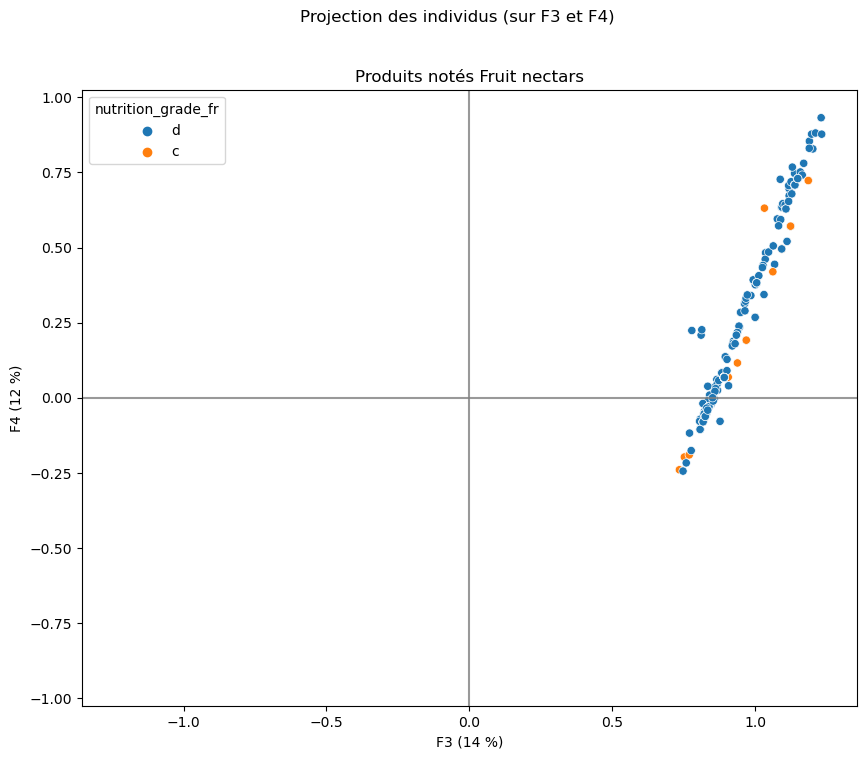

In [53]:
for cat in groupes :
    nutri_cat = pd.DataFrame(df_proj).loc[df['pnns_groups_2']==cat]
    display_factorial_planes(nutri_cat , (2,3), pca = pca , note = cat, clusters = df.loc[df['pnns_groups_2'] == cat, 'nutrition_grade_fr']) 

Selon les groupes, on remarque des clusters correspondant aux notes